In [1]:
# trimming frames from the alphafold trajectories

protein_names = ["BPTI", "BRD4", "HOIP", "LXR", "MBP"]
# set lower threshold to 2.5: 
# if rigid, divide by 2, elif flexible, multiply by 2; 
# if no existing PDB multiply by 2 
conf_thresholds = [(2.5,100),(5,100),(10,100),(1.25,100),(5,100)]

# upper thresholds for contact_order: if small: 99.9, medium: 99.5, large: 99
# lower threshfolds for contact_order
# start with 2 - 
# if small and rigid remove 0.5
# if flexible add 1

con_thresholds = [(1.5,99.5),(2,99),(3,99.5),(1.5,99.5),(3,99.5)]

cov_thresholds = con_thresholds

res_thresholds = [(0.01,99.5),(0.01,99.5),(0.01,99.5),(0.01,99.5),(0.01,99.5)]


k_clusters = 20



In [2]:

import os 

import MDAnalysis as mda
import numpy as np
import json




/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
BPTI_top_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/P00974_60_1_af_sample_127_10000_protonated.pdb"
BPTI_traj_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/P00974_60_1_af_sample_127_10000_protonated.xtc"
BPTI_json_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/P00974_60_1_af_sample_127_10000_ranks.json"
BPTI_segs_path = "/home/alexi/Documents/ValDX/raw_data/HDXer_tutorial/BPTI/BPTI_expt_data/BPTI_residue_segs_trimmed.txt"
BPTI_num_residues = 58


BRD4_top_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/BRD4_APO_484_1_af_sample_127_10000_protonated.pdb"
BRD4_traj_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/BRD4_APO_484_1_af_sample_127_10000_protonated.xtc"
BRD4_json_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/BRD4_APO_484_1_af_sample_127_10000_ranks.json"
BRD4_segs_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/BRD4_APO_segs_trimmed.txt"
BRD4_num_residues = 484

HOIP_top_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/HOIP_apo697_1_af_sample_127_10000_protonated.pdb"
HOIP_traj_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_correctedHOIP_apo697_1_af_sample_127_10000_protonated.xtc"
HOIP_json_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/HOIP_apo697_1_af_sample_127_10000_ranks.json"
HOIP_segs_path = "/home/alexi/Documents/ValDX/raw_data/HOIP/HOIP_apo/HOIP_APO_segs_trimmed.txt"
HOIP_num_residues = 376

LXR_top_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/LXRa200_1_af_sample_127_10000_protonated.pdb"
LXR_traj_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/LXRa200_1_af_sample_127_10000_protonated.xtc"
LXR_json_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/LXRa200_1_af_sample_127_10000_ranks.json"
LXR_segs_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/LXRa_APO_segs200_trimmed.txt"
LXR_num_residues = 250


MBP_top_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/MBP_wt_1_af_sample_127_10000_protonated.pdb"
MBP_traj_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/MBP_wt_1_af_sample_127_10000_protonated.xtc" 
MBP_json_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/MBP_wt_1_af_sample_127_10000_ranks.json"
MBP_segs_path = "/home/alexi/Documents/interpretable-hdxer/data/si_ifg1/json_corrected/MaltoseBindingProtein/MBP_wt1_segs_trimmed.txt"
MBP_num_residues = 396





proteins = {"BPTI": {"top": BPTI_top_path, "traj": BPTI_traj_path, "json": BPTI_json_path, "num_residues": BPTI_num_residues, "segs_path":BPTI_segs_path},
            "BRD4": {"top": BRD4_top_path, "traj": BRD4_traj_path, "json": BRD4_json_path, "num_residues": BRD4_num_residues, "segs_path":BRD4_segs_path},
            "HOIP": {"top": HOIP_top_path, "traj": HOIP_traj_path, "json": HOIP_json_path, "num_residues": HOIP_num_residues, "segs_path":HOIP_segs_path},
            "LXR": {"top": LXR_top_path, "traj": LXR_traj_path, "json": LXR_json_path, "num_residues": LXR_num_residues, "segs_path":LXR_segs_path},
            "MBP": {"top": MBP_top_path, "traj": MBP_traj_path, "json": MBP_json_path, "num_residues": MBP_num_residues, "segs_path":MBP_segs_path}}



def load_json(json_path):
    with open(json_path, 'r') as f:
        data = json.load(f)
    return data


json_data = {protein: load_json(proteins[protein]["json"]) for protein in protein_names}


from typing import Dict

def extract_val_json(protein_data: Dict, key: str="plddt")->np.array:
    
    protein_data = dict(sorted(protein_data.items(), key=lambda x: int(x[0].split("_")[1]), reverse=True))

    val_data = []
    for msa, run in protein_data.items():
        for rank, data in run.items():
            if key in data:
                val_data.append(data[key])

    return np.array(val_data)

plddt_data = {protein: extract_val_json(json_data[protein]) for protein in protein_names}

max_pae_data = {protein: extract_val_json(json_data[protein], key='max_pae') for protein in protein_names}

ptm_data = {protein: extract_val_json(json_data[protein], key='ptm') for protein in protein_names}



In [4]:

import sys
sys.path.append("/home/alexi/Documents/ValDX/")
from ValDX.VDX_dataclasses import Segments

segs_data = {protein:Segments(segs_path=proteins[protein]["segs_path"]) for protein in proteins}


res_data = {protein:segs_data[protein].residues for protein in proteins}
print(res_data)

/home/alexi/Documents/interpretable-hdxer/notebooks/AF_Ensemble_Cleaning


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/Bio/Application/__init__.py:40: BiopythonDeprecationWarning: The Bio.Application modules and modules relying on it have been deprecated.

Due to the on going maintenance burden of keeping command line application
wrappers up to date, we have decided to deprecate and eventually remove these
modules.

We instead now recommend building your command line and invoking it directly
with the subprocess module.
  warnings.warn(


Segments class created with 36 peptides
Resnumbers calculated for 36 segments
Resnumbers calculated for 36 segments
Residues calculated for 36 segments
Resnumbers calculated for 36 segments
Peptides calculated for 36 segments
Calculating residue centrality
Resnumbers calculated for 36 segments
Calculating peptide centrality
Resnumbers calculated for 36 segments
Peptides calculated for 36 segments
Calculating residue centrality
Resnumbers calculated for 36 segments
Peptide centrality calculated for 36 peptides
Segments class created with 94 peptides
Resnumbers calculated for 94 segments
Resnumbers calculated for 94 segments
Residues calculated for 217 segments
Resnumbers calculated for 94 segments
Peptides calculated for 94 segments
Calculating residue centrality
Resnumbers calculated for 94 segments
Calculating peptide centrality
Resnumbers calculated for 94 segments
Peptides calculated for 94 segments
Calculating residue centrality
Resnumbers calculated for 94 segments
Peptide central

In [5]:
# calculate RMSD of each frame in trajectory to the first frame
import pandas as pd

from MDAnalysis.analysis import rms
    

In [6]:

def calculate_rmsd(universe:mda.Universe, residues:list=None, ref_frame_index:int=0):
    

    sel = "protein and name CA"

    if residues is not None:
        resi_sel = " or".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"


    universe.trajectory[ref_frame_index]

    ref = universe.select_atoms(sel)
    
    rmsd = rms.RMSD(universe, ref, select=sel)
    rmsd.run()
    
    return rmsd.results.rmsd[:, 2]


RMSD_df = pd.DataFrame()

for protein in protein_names:

    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0
    residues = res_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    rmsd = calculate_rmsd(universe, residues=residues, ref_frame_index=ref_index)
    
    df_to_add = pd.DataFrame({"protein": protein, "RMSD": [rmsd]})

    RMSD_df = pd.concat([RMSD_df, df_to_add], axis=0)

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


In [7]:
#import pdist
from scipy.spatial.distance import pdist
from MDAnalysis.analysis.align import AlignTraj

def calc_intra_residue_dist(universe, residues:list=None, ref_frame_index:int=0):
    
    """after aligning the traj in memory 
    we calculate the sum of the distances 
    between the atoms of each residue for each frame"""

    sel = "protein and name CA"

    if residues is not None:
        resi_sel = " or".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"


    universe.trajectory[ref_frame_index]

    ref = universe.select_atoms(sel)
    # ref = universe.select_atoms("protein and name CA")
    # Align the trajectory to the reference structure
    alignment = mda.analysis.align.AlignTraj(universe, ref, select=sel, in_memory=True).run()
    
    n_frames = len(universe.trajectory)
    n_residues = len(ref.residues)

    # calculate the intrares distances of atomgroup for each frame

    calc_intra_residue_dist = np.zeros((n_frames, n_residues*(n_residues-1)//2))
    # coords = np.zeros((n_frames, n_residues, 3))
    for i, ts in enumerate(universe.trajectory):
        coords = ref.positions

        calc_intra_residue_dist[i] = pdist(coords)
 

    print(calc_intra_residue_dist.shape)

    # average the distances for each frame
    avg_intra_residue_dist = np.mean(calc_intra_residue_dist, axis=1)

    return avg_intra_residue_dist


intra_residue_dist_df = pd.DataFrame()

for protein in protein_names:

    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0
    residues = res_data[protein]

    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    intra_residue_dist = calc_intra_residue_dist(universe, residues=residues, ref_frame_index=ref_index)
    
    df_to_add = pd.DataFrame({"protein": protein, "intra_residue_dist": [intra_residue_dist]})

    intra_residue_dist_df = pd.concat([intra_residue_dist_df, df_to_add], axis=0)
    

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


(12700, 630)
(12700, 23436)
(12700, 44551)
(12700, 22155)
(12700, 58653)


In [8]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from scipy.stats import pearsonr
from MDAnalysis.analysis.align import AlignTraj

def calc_intra_residue_correlation(universe, residues:list=None, ref_frame_index:int=0):
    """
    After aligning the trajectory in memory, calculate the correlation
    of the intra-residue distances of each frame to the reference frame.
    """
    sel = "protein and name CA"
    if residues is not None:
        resi_sel = " or ".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"

    universe.trajectory[ref_frame_index]
    ref = universe.select_atoms(sel)

    # Align the trajectory to the reference structure
    alignment = AlignTraj(universe, ref, select=sel, in_memory=True).run()

    n_frames = len(universe.trajectory)
    n_residues = len(ref.residues)

    # Calculate the intra-residue distance matrix for the reference frame
    ref_coords = ref.positions
    ref_dist_matrix = squareform(pdist(ref_coords))

    # Calculate the correlation of the intra-residue distances for each frame
    intra_residue_correlation = np.zeros(n_frames)
    for i, ts in enumerate(universe.trajectory):
        coords = ref.positions
        dist_matrix = squareform(pdist(coords))
        intra_residue_correlation[i] = pearsonr(dist_matrix.flatten(), ref_dist_matrix.flatten())[0]

    return intra_residue_correlation

# ... (rest of the code remains the same)


intra_residue_covariance_df = pd.DataFrame()
for protein in protein_names:
    print(protein)
    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0
    residues = res_data[protein]    
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    intra_residue_covariance = calc_intra_residue_correlation(universe, residues=residues, ref_frame_index=ref_index)
    df_to_add = pd.DataFrame({"protein": protein, "intra_residue_covariance": [intra_residue_covariance]})
    intra_residue_covariance_df = pd.concat([intra_residue_covariance_df, df_to_add], axis=0)

BPTI


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


BRD4
HOIP
LXR
MBP


In [9]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from MDAnalysis.analysis.align import AlignTraj

def calc_contact_order(universe, cutoff=12.0, residues:list=None, ref_frame_index:int=0):
    
    """
    After aligning the trajectory in memory, calculate the contact order
    of the protein for each frame.
    """

    sel = "protein and name CA"

    if residues is not None:
        resi_sel = " or".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"


    universe.trajectory[ref_frame_index]

    ref = universe.select_atoms(sel)
    # ref = universe.select_atoms("protein and name CA")
    # Align the trajectory to the reference structure
    alignment = mda.analysis.align.AlignTraj(universe, ref, select=sel, in_memory=True).run()
    
    n_frames = len(universe.trajectory)
    n_residues = len(ref.residues)
    
    # Calculate the contact order for each frame
    contact_order = np.zeros(n_frames)
    for i, ts in enumerate(universe.trajectory):
        coords = ref.positions
        dist_matrix = squareform(pdist(coords))
        contacts = (dist_matrix < cutoff).astype(int)
        np.fill_diagonal(contacts, 0)  # Exclude self-contacts
        seq_sep_matrix = np.abs(np.arange(n_residues)[:, np.newaxis] - np.arange(n_residues))
        contact_order[i] = np.sum(contacts * seq_sep_matrix) / (n_residues * np.sum(contacts))
    
    return contact_order

contact_order_df = pd.DataFrame()
for protein in protein_names:

    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0
    residues = res_data[protein]      
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    contact_order = calc_contact_order(universe, residues=residues, ref_frame_index=ref_index)
    df_to_add = pd.DataFrame({"protein": protein, "contact_order": [contact_order]})
    contact_order_df = pd.concat([contact_order_df, df_to_add], axis=0)

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


In [10]:
# import numpy as np
# from scipy.spatial.distance import pdist, squareform,cdist
# from MDAnalysis.analysis.align import AlignTraj
# def calc_clashes(universe, cutoff=1.6, residues:list=None, ref_frame_index:int=0):
#     """
#     After aligning the trajectory in memory, calculate the number of clashes
#     (contacts below a cutoff distance) for the heavy atoms in each frame.
#     """
#     # select all carbon atoms
#     sel = "type C"
#     if residues is not None:
#         resi_sel = " or ".join([f"resid {res}" for res in residues])
#         sel = sel + f" and ({resi_sel})"

#     ref = universe.select_atoms(sel)

#     # Align the trajectory to the reference structure
#     # alignment = mda.analysis.align.AlignTraj(universe, ref, select=sel, in_memory=True).run()

#     n_frames = len(universe.trajectory)
#     print(protein, n_frames)

#     # Calculate the number of clashes for each frame
#     clashes = np.zeros(n_frames)
#     for i, ts in enumerate(universe.trajectory):
#         print(i, end="\r")
#         coords = ref.atoms.positions
#         dist_matrix = cdist(coords, coords)
#         np.fill_diagonal(dist_matrix, np.inf)  # Exclude self-contacts
#         # normalise by num residues
#         clashes[i] = np.sum(dist_matrix < cutoff) / len(ref.residues)

#     return clashes

# clashes_df = pd.DataFrame()
# for protein in protein_names:
#     if protein == "BRD4":
#         ref_index = 1
#     else:
#         ref_index = 0
    
#     residues = res_data[protein]
#     universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
#     clashes = calc_clashes(universe, residues=residues, ref_frame_index=ref_index)
#     df_to_add = pd.DataFrame({"protein": protein, "clashes": [clashes]})
#     clashes_df = pd.concat([clashes_df, df_to_add], axis=0)

In [11]:
import numpy as np
from scipy.spatial.distance import pdist, squareform, cdist
from MDAnalysis.analysis.align import AlignTraj

def calc_clashes(universe, cutoff=1.5, residues:list=None, ref_frame_index:int=0):
    """
    After aligning the trajectory in memory, calculate the number of inter-residue clashes
    (contacts below a cutoff distance) for the carbon atoms in each frame.
    """
    # Select all carbon atoms
    sel = "not name H*"
    if residues is not None:
        resi_sel = " or ".join([f"resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"
    
    ref = universe.select_atoms(sel)
    
    n_frames = len(universe.trajectory)
    print(protein, n_frames)
    
    # Calculate the number of inter-residue clashes for each frame
    clashes = np.zeros(n_frames)
    for i, ts in enumerate(universe.trajectory):
        print(i, end="\r")
        coords = ref.atoms.positions
        
        # Create a mask for atom pairs belonging to different residues
        resids = ref.atoms.resids
        mask = resids[:, np.newaxis] != resids
        
        dist_matrix = cdist(coords, coords)
        np.fill_diagonal(dist_matrix, np.inf)  # Exclude self-contacts
        
        # Apply the mask to the distance matrix to consider only inter-residue distances
        dist_matrix[~mask] = np.inf
        
        # Normalize by the number of residue pairs
        # num_residue_pairs = len(np.unique(ref.resids))
        clashes[i] = np.sum(dist_matrix < cutoff)
    
    return clashes

clashes_df = pd.DataFrame()
for protein in protein_names:
    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0
    
    residues = res_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    clashes = calc_clashes(universe, residues=residues, ref_frame_index=ref_index)
    df_to_add = pd.DataFrame({"protein": protein, "clashes": [clashes]})
    clashes_df = pd.concat([clashes_df, df_to_add], axis=0)

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


BPTI 12700


BRD4 12700
HOIP 12700


In [12]:
#  

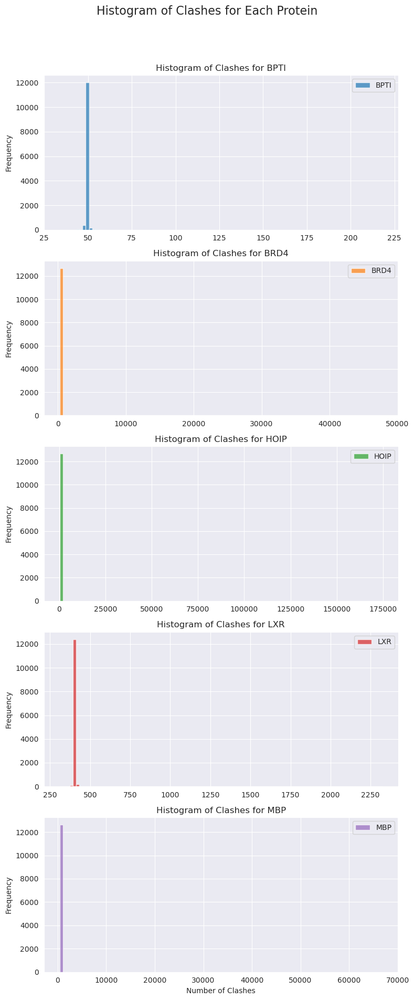

In [13]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set a custom style for the plot
sns.set_style("darkgrid")
# sns.set_palette("viridis", len(protein_names))

# Create a figure with subplots for each protein
fig, axes = plt.subplots(nrows=len(protein_names), ncols=1, figsize=(8, 4*len(protein_names)), sharex=False)

# Iterate over each protein and plot the histogram on a separate subplot
for i, protein in enumerate(protein_names):
    ax = axes[i]
    clashes = clashes_df[clashes_df["protein"] == protein]["clashes"].values[0]
    
    ax.hist(clashes, bins=100, alpha=0.7, label=protein, color=f"C{i}")
    
    ax.set_ylabel("Frequency")
    ax.set_title(f"Histogram of Clashes for {protein}")
    ax.legend()
    
    # ax.set_yscale("log")
    # ax.set_xscale("log")
    
    # Set x-axis label only for the bottom subplot
    if i == len(protein_names) - 1:
        ax.set_xlabel("Number of Clashes")
    
    # Adjust the spacing between subplots
    plt.subplots_adjust(hspace=0.4)

# Add a main title for the entire figure
fig.suptitle("Histogram of Clashes for Each Protein", fontsize=16)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the spacing at the top to accommodate the main title
plt.show()

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


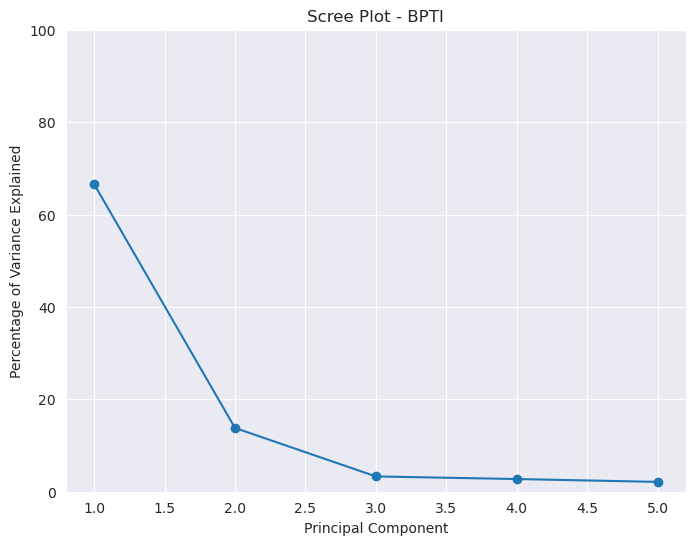

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


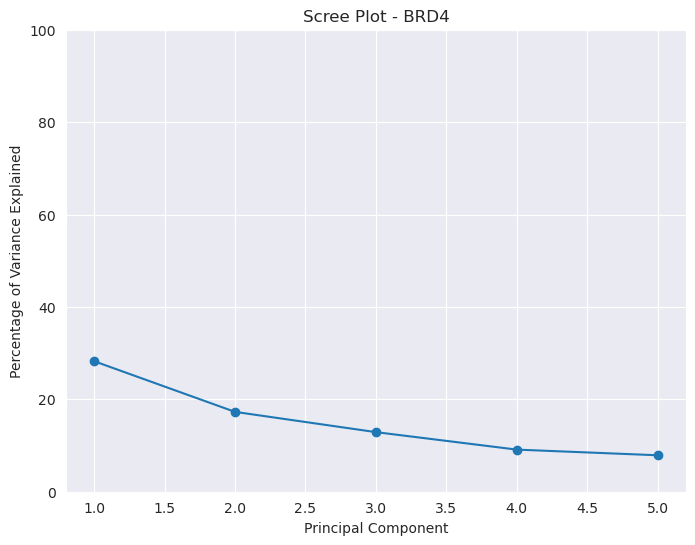

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


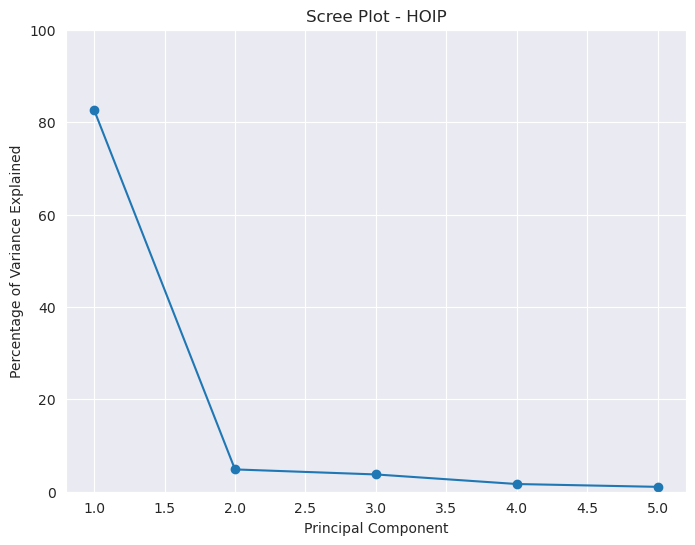

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


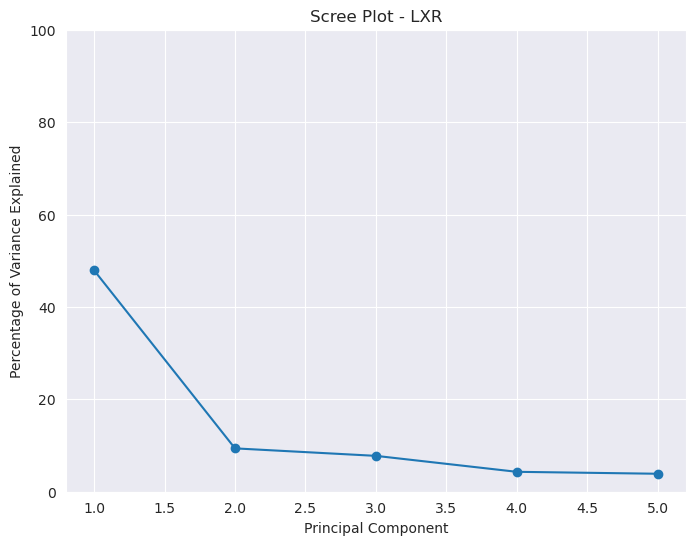

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


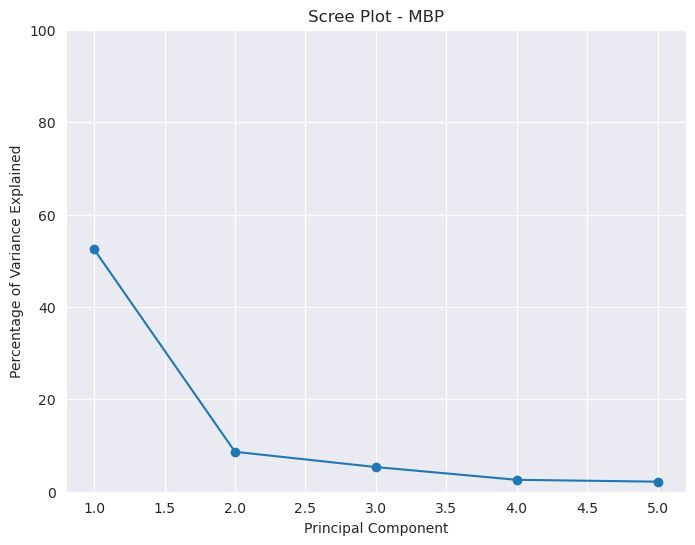

In [14]:
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

def calculate_pca(universe, num_components=100, residues:list=None, ref_frame_index:int=0):
    sel = "protein and name CA"
    if residues is not None:
        resi_sel = " or".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"

    universe.trajectory[ref_frame_index]
    ref = universe.select_atoms(sel)

    alignment = mda.analysis.align.AlignTraj(universe, ref, select=sel, in_memory=True).run()

    n_frames = len(universe.trajectory)
    n_residues = len(ref.residues)

    calc_intra_residue_dist = np.zeros((n_frames, n_residues*(n_residues-1)//2))

    for i, ts in enumerate(universe.trajectory):
        coords = ref.positions
        calc_intra_residue_dist[i] = pdist(coords)

    pca = PCA(n_components=num_components)
    pca.fit(calc_intra_residue_dist)
    data = pca.transform(calc_intra_residue_dist)
    explained_variance_ratio = pca.explained_variance_ratio_
    
        # Plot the percentage of variance explained for each dimension
    plt.figure(figsize=(8, 6))
    plt.plot(range(1, n_dims+1), explained_variance_ratio*100, marker='o')
    plt.xlabel('Principal Component')
    plt.ylabel('Percentage of Variance Explained')
    plt.title(f'Scree Plot - {protein}')
    plt.ylim(0, 100)
    plt.grid(True)
    plt.show()


    return data

pca_df = pd.DataFrame()
n_dims = 5

for protein in protein_names:
    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0

    residues = res_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    pca = calculate_pca(universe, num_components=n_dims, residues=residues, ref_frame_index=ref_index)
    df_to_add = pd.DataFrame({"protein": protein, "pca": [pca], "n_dims": n_dims})
    pca_df = pd.concat([pca_df, df_to_add], axis=0)
    


In [15]:
import phate

def calculate_phate(universe, num_components=2, residues:list=None, ref_frame_index:int=0):
    sel = "protein and name CA"
    if residues is not None:
        resi_sel = " or".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"

    universe.trajectory[ref_frame_index]
    ref = universe.select_atoms(sel)

    alignment = mda.analysis.align.AlignTraj(universe, ref, select=sel, in_memory=True).run()

    n_frames = len(universe.trajectory)
    n_residues = len(ref.residues)

    # calculate the intrares distances of atomgroup for each frame
    calc_intra_residue_dist = np.zeros((n_frames, n_residues*(n_residues-1)//2))

    for i, ts in enumerate(universe.trajectory):
        coords = ref.positions
        calc_intra_residue_dist[i] = pdist(coords)

    phate_operator = phate.PHATE(n_components=num_components)
    data = phate_operator.fit_transform(calc_intra_residue_dist)
    return data

phate_df = pd.DataFrame()
n_dims = 2

for protein in protein_names:
    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0

    residues = res_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    phate_embedding = calculate_phate(universe, num_components=n_dims, residues=residues, ref_frame_index=ref_index)
    df_to_add = pd.DataFrame({"protein": protein, "phate": [phate_embedding], "n_dims": n_dims})
    phate_df = pd.concat([phate_df, df_to_add], axis=0)

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


Calculating PHATE...
  Running PHATE on 12700 observations and 630 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 0.22 seconds.
    Calculating KNN search...
    Calculated KNN search in 5.72 seconds.
    Calculating affinities...
    Calculated affinities in 0.07 seconds.
  Calculated graph and diffusion operator in 6.02 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.39 seconds.
    Calculating KMeans...
    Calculated KMeans in 2.15 seconds.
  Calculated landmark operator in 3.01 seconds.
  Calculating optimal t...
    Automatically selected t = 51
  Calculated optimal t in 0.99 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.64 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.40 seconds.
Calculated PHATE in 13.07 seconds.


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


Calculating PHATE...
  Running PHATE on 12700 observations and 23436 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...


    Calculated PCA in 7.44 seconds.
    Calculating KNN search...
    Calculated KNN search in 3.87 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 11.35 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.31 seconds.
    Calculating KMeans...
    Calculated KMeans in 2.00 seconds.
  Calculated landmark operator in 2.74 seconds.
  Calculating optimal t...
    Automatically selected t = 37
  Calculated optimal t in 1.00 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.46 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.37 seconds.
Calculated PHATE in 17.93 seconds.


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


Calculating PHATE...
  Running PHATE on 12700 observations and 44551 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 15.76 seconds.
    Calculating KNN search...
    Calculated KNN search in 2.96 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 18.77 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.34 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.72 seconds.
  Calculated landmark operator in 2.49 seconds.
  Calculating optimal t...
    Automatically selected t = 30
  Calculated optimal t in 0.78 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.41 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.39 seconds.
Calculated PHATE in 24.84 seconds.


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


Calculating PHATE...
  Running PHATE on 12700 observations and 22155 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 7.08 seconds.
    Calculating KNN search...
    Calculated KNN search in 4.50 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 11.62 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.38 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.30 seconds.
  Calculated landmark operator in 2.12 seconds.
  Calculating optimal t...
    Automatically selected t = 51
  Calculated optimal t in 0.89 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.39 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.42 seconds.
Calculated PHATE in 17.45 seconds.


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning: invalid value encountered in scalar divide
  alpha = np.rad2deg(np.arccos(np.dot(y, z) / (ly * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning: invalid value encountered in scalar divide
  beta = np.rad2deg(np.arccos(np.dot(x, z) / (lx * lz)))
/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning: invalid value encountered in scalar divide
  gamma = np.rad2deg(np.arccos(np.dot(x, y) / (lx * ly)))


Calculating PHATE...
  Running PHATE on 12700 observations and 58653 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 20.27 seconds.
    Calculating KNN search...
    Calculated KNN search in 2.26 seconds.
    Calculating affinities...
    Calculated affinities in 0.05 seconds.
  Calculated graph and diffusion operator in 22.59 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.38 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.59 seconds.
  Calculated landmark operator in 2.41 seconds.
  Calculating optimal t...
    Automatically selected t = 47
  Calculated optimal t in 0.81 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.45 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.37 seconds.
Calculated PHATE in 28.63 seconds.


(12700,)
BPTI
0.37
(12700,)
BRD4
0.32
(12700,)
HOIP
0.39
(12700,)
LXR
0.42
(12700,)
MBP
0.37


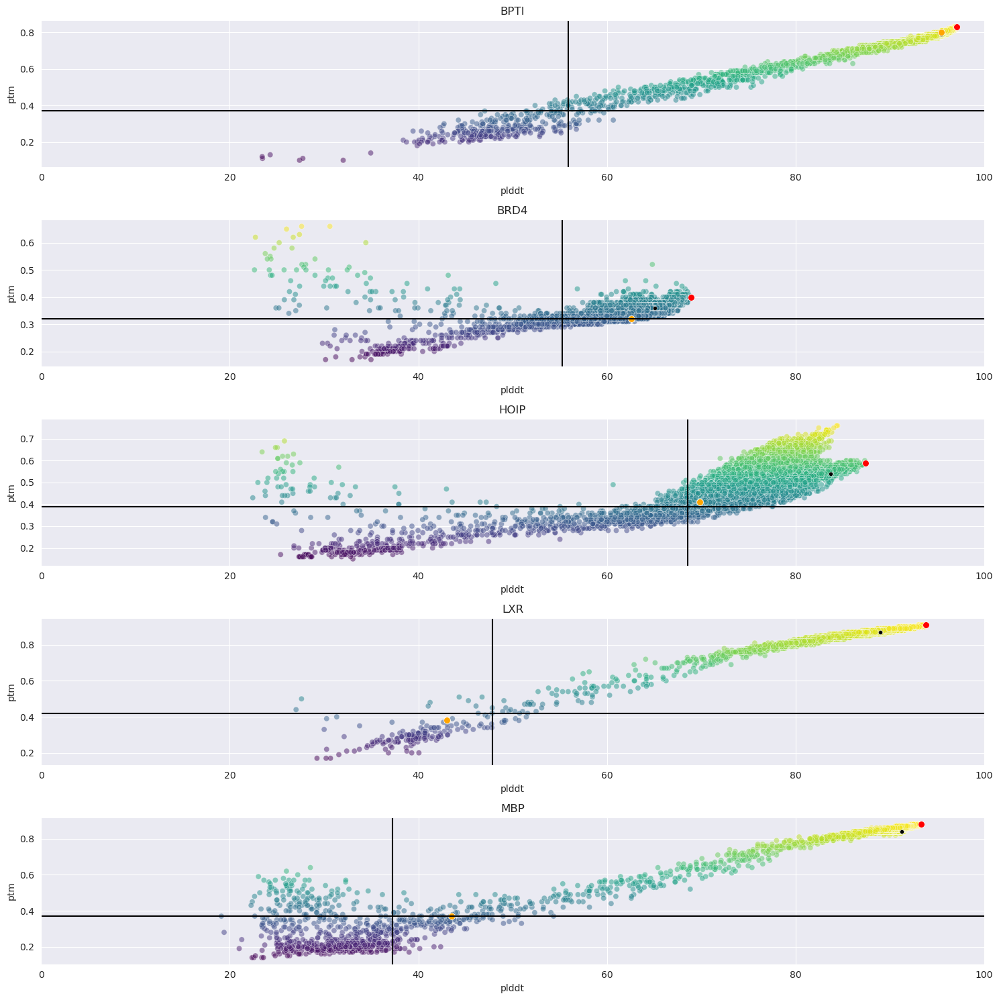

In [16]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


# plot RMSD for each protein as a histogram

fig, ax = plt.subplots(len(protein_names), 1, figsize=(15, 15))


thresholds = conf_thresholds

for i, protein in enumerate(protein_names):
    contact_order = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
    print(contact_order.shape)
    print(protein)
    covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
    ptm = ptm_data[protein]
    max_pae = max_pae_data[protein]
    # det = intra_residue_det_df[intra_residue_det_df["protein"] == protein]["intra_residue_det"].values[0]
    # det = det/ det[0]
    # # make det all positive
    # # det = np.abs(det)
    # det = np.log(det)
    # print(np.mean(det))

    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0
    plddt = plddt_data[protein]

    max_plddt_index = np.where(plddt == np.max(plddt))
    # print(len(det))
    max_pae_index = np.where(max_pae == np.max(max_pae))


    sns.scatterplot(x=plddt, y=ptm, ax=ax[i], alpha=0.5, c=ptm, cmap='viridis')
    # plot the 0th as a black dot
    sns.scatterplot(x=[plddt[ref_index]], y=[ptm[ref_index]], ax=ax[i], c="black",s=20)
    sns.scatterplot(x=plddt[max_plddt_index], y=ptm[max_plddt_index], ax=ax[i], c="red",s=50)
    sns.scatterplot(x=plddt[max_pae_index], y=ptm[max_pae_index], ax=ax[i], c="orange",s=50)

    # min_threshold

    ptm_threshold = np.percentile(ptm,thresholds[i][0])
    # max_threshold = np.percentile(plddt,100)
    plddt_threshold =np.percentile(plddt,thresholds[i][0])
    # ax[i].axvline(50)
    ax[i].axvline(plddt_threshold, c="black")

    ax[i].axhline(ptm_threshold, c="black")

    print(ptm_threshold)
    # print(np.min(contact_order))
    ax[i].set_title(protein)
    ax[i].set_xlabel("plddt")
    ax[i].set_ylabel("ptm")
    # ax[i].set_xscale("log")
    ax[i].set_xlim(0,100)


plt.tight_layout()

plt.show() 

(12700,)
BPTI
(12700,)
BRD4
(12700,)
HOIP
(12700,)
LXR
(12700,)
MBP


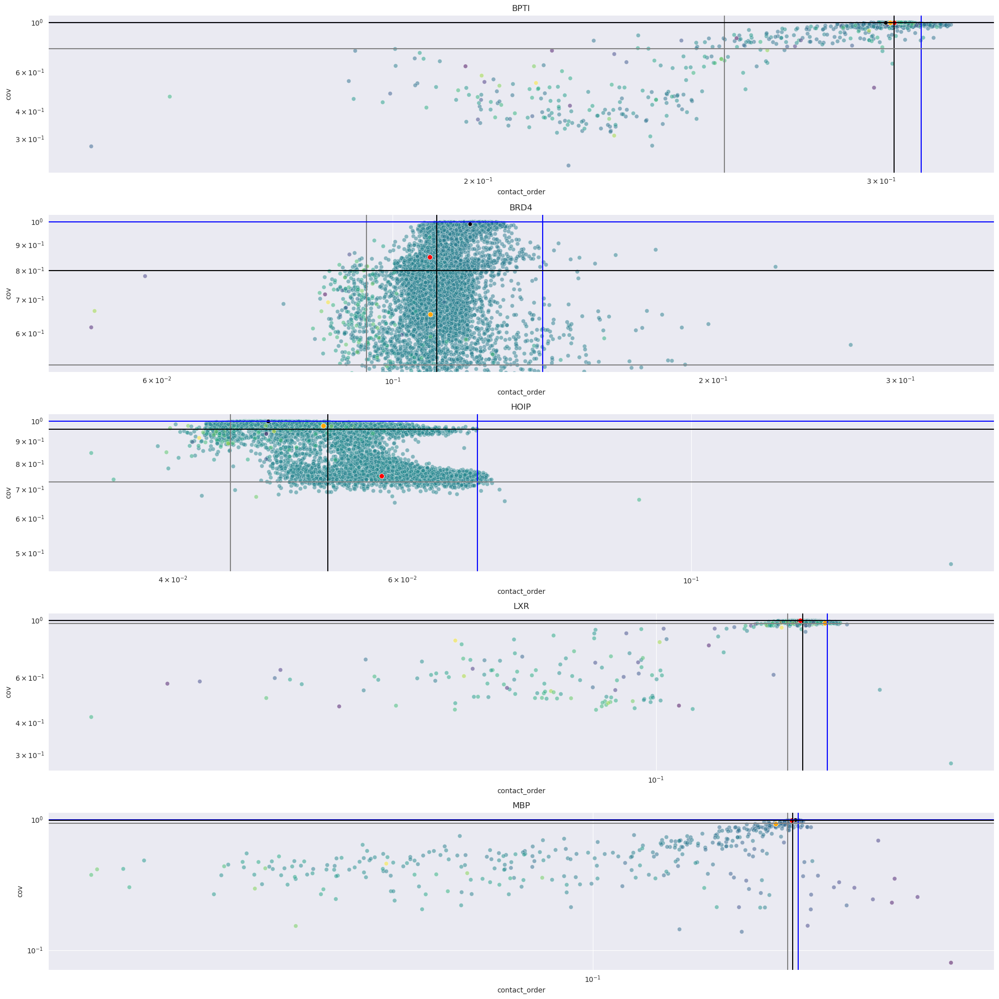

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np


# plot RMSD for each protein as a histogram
conf_thresholds = conf_thresholds

fig, ax = plt.subplots(len(protein_names), 1, figsize=(20, 20))
thresholds = con_thresholds
cov_thresholds = cov_thresholds

for i, protein in enumerate(protein_names):
    contact_order = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
    print(contact_order.shape)
    print(protein)
    intra_res = intra_residue_dist_df[intra_residue_dist_df["protein"]==protein]["intra_residue_dist"].values[0]
    covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
    plddt = plddt_data[protein]
    max_pae = max_pae_data[protein]
    ptm = ptm_data[protein]
    clashes = clashes_df[clashes_df["protein"] == protein]["clashes"].values[0]
    # det = intra_residue_det_df[intra_residue_det_df["protein"] == protein]["intra_residue_det"].values[0]
    # det = det/ det[0]
    # # make det all positive
    # # det = np.abs(det)
    # det = np.log(det)
    # print(np.mean(det))
    plddt = plddt_data[protein]
    # ptm = 
    # print(len(det))    
    if protein == "BRD4":
        ref_index = 1
    else:
        ref_index = 0
    plddt = plddt_data[protein]

    max_plddt_index = np.where(plddt == np.max(plddt))


    plddt_threshold = np.percentile(plddt,conf_thresholds[i][0])
    ptm_threshold =  np.percentile(ptm,conf_thresholds[i][0])
    
        # Create a mask for plddt values below the threshold
    plddt_mask = (plddt > plddt_threshold)

    # Create a mask for ptm values below the threshold
    ptm_mask = (ptm > ptm_threshold)

    # Combine the masks to exclude frames that are below the threshold for either
    combined_mask = plddt_mask & ptm_mask

    masked_contact_order = contact_order[combined_mask]
    masked_covariance = covariance[combined_mask]


    max_pae_index = np.where(max_pae == np.max(max_pae))

    sns.scatterplot(x=masked_contact_order, y=masked_covariance, ax=ax[i], alpha=0.5, c=intra_residue_dist[combined_mask], cmap='viridis')
    # plot the 0th as a black dot
    sns.scatterplot(x=[contact_order[ref_index]], y=[covariance[ref_index]], ax=ax[i], c="black")
    sns.scatterplot(x=contact_order[max_plddt_index], y=covariance[max_plddt_index], ax=ax[i], c="red",s=50)
    sns.scatterplot(x=contact_order[max_pae_index], y=covariance[max_pae_index], ax=ax[i], c="orange",s=50)

    max_threshold = np.percentile(masked_contact_order,thresholds[i][1])
    min_threshold = np.percentile(masked_contact_order,thresholds[i][0])

    med_threshold =np.percentile(masked_contact_order,50)
    ax[i].axvline(max_threshold,c="blue")
    ax[i].axvline(min_threshold,c="grey")
    ax[i].axvline(med_threshold,c="black")


    max_threshold = np.percentile(masked_covariance,100)
    min_threshold = np.percentile(masked_covariance,cov_thresholds[i][0])

    med_threshold =np.percentile(masked_covariance,50)
    ax[i].axhline(max_threshold,c="blue")
    ax[i].axhline(min_threshold,c="grey")
    ax[i].axhline(med_threshold,c="black")#, linewidth=10)
    



    ax[i].set_title(protein)
    ax[i].set_xlabel("contact_order")
    ax[i].set_ylabel("cov")
    ax[i].set_yscale("log")
    ax[i].set_xscale("log")


plt.tight_layout()

plt.show() 

In [18]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Create a 3D plot for each protein
fig = make_subplots(
    rows=len(protein_names), cols=1,
    specs=[[{'type': 'scatter'}] for _ in range(len(protein_names))],  # Changed 'scene' to 'scatter'
    subplot_titles=protein_names,
    vertical_spacing=0.05
)





for i, protein in enumerate(protein_names):
    intra_residue_dists = intra_residue_dist_df[intra_residue_dist_df["protein"]==protein]["intra_residue_dist"].values[0]
    rmsd = RMSD_df[RMSD_df["protein"] == protein]["RMSD"].values[0]
    plddt = plddt_data[protein]
    max_pae = max_pae_data[protein]
    ptm = ptm_data[protein]
    c = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
    covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
    pca = pca_df[pca_df["protein"]==protein]["pca"].values[0]

    clashes = clashes_df[clashes_df["protein"] == protein]["clashes"].values[0]
   
    plddt_threshold = np.percentile(plddt,conf_thresholds[i][0])
    ptm_threshold =  np.percentile(ptm,conf_thresholds[i][0])
    


    # labels = []    
    # for idx, pt in enumerate(ptm):
    #     pl = plddt[idx]
    #     con = contact_order[idx]
    #     cov = covariance[idx]

    #     if (pl < plddt_threshold and pt < ptm_threshold):
    #         label = 0
    #     elif (con < min_con) or (con > max_con):
    #         label = 0
    #     elif(cov < min_cov):
    #         label = 0
    #     # elif pt < ptm_threshold:
    #     #     label = 0.4
    #     else:
    #         label = 1
     
    #     labels.append(label)
    # labels = np.array(labels)

    plddt_threshold = np.percentile(plddt,conf_thresholds[i][0])
    ptm_threshold =  np.percentile(ptm,conf_thresholds[i][0])
    
        # Create a mask for plddt values below the threshold
    plddt_mask = (plddt > plddt_threshold)

    # Create a mask for ptm values below the threshold
    ptm_mask = (ptm > ptm_threshold)

    # Combine the masks 
    combined_mask = plddt_mask & ptm_mask

    masked_contact_order = contact_order[combined_mask]
    masked_covariance = covariance[combined_mask]
    masked_intra_residue_dists = intra_residue_dists[combined_mask]
    # masked_pca = pca[combined_mask]

    max_cov = np.percentile(covariance,100)
    mean_cov = np.mean(covariance)

    min_cov = np.percentile(covariance,1)
    # print(max_cov)
    # print(min_cov)
    cov_threshold = np.percentile(masked_covariance,cov_thresholds[i][0])

    median_con = np.median(masked_contact_order)
    mean_con = np.mean(masked_contact_order)
    max_con = np.percentile(masked_contact_order, con_thresholds[i][1])
    mean_con = np.mean(masked_contact_order)

    min_con = np.percentile(masked_contact_order,con_thresholds[i][0])

    min_con_mask = (masked_contact_order > min_con)
    max_con_mask = (masked_contact_order < max_con)

    con_mask = min_con_mask & max_con_mask

    cov_mask = (masked_covariance > cov_threshold)

    # 
    con_cov_mask = con_mask & cov_mask

    masked_intra_residue_dists = intra_residue_dists[combined_mask][con_cov_mask]


    min_dist =  np.percentile(masked_intra_residue_dists,res_thresholds[i][0])
    max_dist = np.percentile(masked_intra_residue_dists,res_thresholds[i][1])
    
    min_dist_mask = (masked_intra_residue_dists > min_dist)
    max_dist_mask = (masked_intra_residue_dists < max_dist)


    dist_mask = min_dist_mask & max_dist_mask

    # dist_con_cov_mask = np.logical_or(dist_mask,con_cov_mask)
    feats_all = pca
    
    _pca= pca[combined_mask][con_cov_mask][dist_mask]

    _pca1 = _pca[:,0]
    _pca2 = _pca[:,1]
    
    pca1 = pca[:,0]
    pca2 = pca[:,1]



    trace = go.Scatter(
        x=_pca1,
        y=_pca2,
        mode='markers',
        marker=dict(
            size=5,
            color=intra_residue_dist[combined_mask][con_cov_mask],
            colorscale='Viridis',
            opacity=0.5,
            colorbar=dict(  # Added colorbar
                title='Label',
                len=0.8,
                thickness=20,
            )
        ),
        name=protein,
        hovertemplate='Element: %{pointNumber}<br>PCA1: %{x:.2f}<br>PCA2: %{y:.2f}<extra></extra>'
    )

    fig.add_trace(trace, row=i+1, col=1)
    

    pca_indexes = np.where(pca


    trace = go.Scatter(
        x=anti_pca[:,0],
        y=anti_pca[:,1],
        mode='markers',
        marker=dict(
            size=7,
            color="Grey",
            # colorscale='Viridis',
            opacity=0.5,
            colorbar=dict(  # Added colorbar
                title='Label',
                len=0.8,
                thickness=20,
            )
        ),
        name=protein,
        hovertemplate='Element: %{pointNumber}<br>PCA1: %{x:.2f}<br>PCA2: %{y:.2f}<extra></extra>'
    )

    fig.add_trace(trace, row=i+1, col=1)


        
    max_plddt_index = np.where(plddt == np.max(plddt))
    print("Max plddt index", max_plddt_index)
    # plot max plddt as a orange 
    trace = go.Scatter(
        x=pca1[max_plddt_index],
        y=pca2[max_plddt_index],
        mode='markers',
        marker=dict(
            size=10,
            color="red",
            # colorscale='Viridis',
            opacity=0.8,
        ),
    
        name=protein,
        hovertemplate='Element: %{pointNumber}<br>PCA1: %{x:.2f}<br>PCA2: %{y:.2f}<extra></extra>'

    )

    fig.add_trace(trace, row=i+1, col=1)


    # plot max plddt as a orange 
    trace = go.Scatter(
        x=[pca1[0]],
        y=[pca2[0]],
        mode='markers',
        marker=dict(
            size=10,
            color="black",
            # colorscale='Viridis',
            opacity=0.8,
        ),
    
        name=protein,
        hovertemplate='Element: %{pointNumber}<br>PCA1: %{x:.2f}<br>PCA2: %{y:.2f}<extra></extra>'

    )

    fig.add_trace(trace, row=i+1, col=1)


    max_pae_index = np.where(max_pae == np.max(max_pae))
    print("Max pae index", max_pae_index)

    # plot max plddt as a orange 
    trace = go.Scatter(
        x=pca1[max_pae_index],
        y=pca2[max_pae_index],
        mode='markers',
        marker=dict(
            size=10,
            color="orange",
            # colorscale='Viridis',
            opacity=0.8,
        ),
    
        name=protein,
        hovertemplate='Element: %{pointNumber}<br>PCA1: %{x:.2f}<br>PCA2: %{y:.2f}<extra></extra>'

    )

    fig.add_trace(trace, row=i+1, col=1)



    fig.update_xaxes(title_text='PCA1', row=i+1, col=1)  # Updated axis title
    fig.update_yaxes(title_text='PCA2', row=i+1, col=1)  # Updated axis title

fig.update_layout(
    height=300 * len(protein_names),
    width=800,
    title_text='2D Scatter Plot of PCA1 and PCA2',
    showlegend=False
)

fig.show()

SyntaxError: invalid syntax (3522245646.py, line 146)

In [ ]:
# plot PCA of all data for each protein coloured by each of the features: plddt, contact_order, cov, intra_residue_dist


In [ ]:
from sklearn.cluster import KMeans

all_masks_frames = {}
all_masks_labels = {}
all_masks_indexes = {}
con_cov_masks_frames = {}
conf_masks_frames = {}
no_mask_frames = {}




for i, protein in enumerate(protein_names):
    intra_residue_dists = intra_residue_dist_df[intra_residue_dist_df["protein"]==protein]["intra_residue_dist"].values[0]
    rmsd = RMSD_df[RMSD_df["protein"] == protein]["RMSD"].values[0]
    plddt = plddt_data[protein]
    max_pae = max_pae_data[protein]
    ptm = ptm_data[protein]
    c = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
    covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
    pca = pca_df[pca_df["protein"]==protein]["pca"].values[0]
    clashes = clashes_df[clashes_df["protein"] == protein]["clashes"].values[0]

   
    plddt_threshold = np.percentile(plddt,conf_thresholds[i][0])
    ptm_threshold =  np.percentile(ptm,conf_thresholds[i][0])
    


    # labels = []    
    # for idx, pt in enumerate(ptm):
    #     pl = plddt[idx]
    #     con = contact_order[idx]
    #     cov = covariance[idx]

    #     if (pl < plddt_threshold and pt < ptm_threshold):
    #         label = 0
    #     elif (con < min_con) or (con > max_con):
    #         label = 0
    #     elif(cov < min_cov):
    #         label = 0
    #     # elif pt < ptm_threshold:
    #     #     label = 0.4
    #     else:
    #         label = 1
     
    #     labels.append(label)
    # labels = np.array(labels)

    plddt_threshold = np.percentile(plddt,conf_thresholds[i][0])
    ptm_threshold =  np.percentile(ptm,conf_thresholds[i][0])
    
        # Create a mask for plddt values below the threshold
    plddt_mask = (plddt > plddt_threshold)

    # Create a mask for ptm values below the threshold
    ptm_mask = (ptm > ptm_threshold)

    # Combine the masks 
    combined_mask = plddt_mask & ptm_mask

    masked_contact_order = contact_order[combined_mask]
    masked_covariance = covariance[combined_mask]
    masked_intra_residue_dists = intra_residue_dists[combined_mask]
    # masked_pca = pca[combined_mask]

    # max_cov = np.percentile(covariance,100)
    # mean_cov = np.mean(covariance)

    # min_cov = np.percentile(covariance,1)
    # print(max_cov)
    # print(min_cov)
    cov_threshold = np.percentile(masked_covariance,cov_thresholds[i][0])

    median_con = np.median(masked_contact_order)
    mean_con = np.mean(masked_contact_order)
    max_con = np.percentile(masked_contact_order, con_thresholds[i][1])
    mean_con = np.mean(masked_contact_order)

    min_con = np.percentile(masked_contact_order,con_thresholds[i][0])

    min_con_mask = (masked_contact_order > min_con)
    max_con_mask = (masked_contact_order < max_con)

    con_mask = min_con_mask & max_con_mask

    cov_mask = (masked_covariance > cov_threshold)

    # 
    con_cov_mask = con_mask & cov_mask

    masked_intra_residue_dists = intra_residue_dists[combined_mask][con_cov_mask]


    min_dist =  np.percentile(masked_intra_residue_dists,res_thresholds[i][0])
    max_dist = np.percentile(masked_intra_residue_dists,res_thresholds[i][1])
    
    min_dist_mask = (masked_intra_residue_dists > min_dist)
    max_dist_mask = (masked_intra_residue_dists < max_dist)


    dist_mask = min_dist_mask & max_dist_mask

    masked_clashes = clashes[combined_mask][con_cov_mask][dist_mask]

    max_clash = np.percentile(masked_clashes,95)
    print(max_clash)
    clash_mask = (masked_clashes <= max_clash)
    print(clash_mask)
    print(np.sum(clash_mask))
    # labels = []    
    # for idx, pt in enumerate(ptm):
    #     pl = plddt[idx]
    # Rest of the code...
    feats= pca[combined_mask][con_cov_mask][dist_mask][clash_mask]
    
    

    feats_con = pca[combined_mask][con_cov_mask]

    feats_conf = pca[combined_mask]

    feats_all = pca 
    # feat2 = pca2[combined_mask][con_cov_mask][dist_mask]



    kmeans = KMeans(n_clusters=k_clusters, random_state=42)

    kmeans.fit(feats_all)

    # Get the cluster centers
    cluster_centers = kmeans.cluster_centers_

    # Find the closest frames to each cluster center
    closest_frames = kmeans.transform(feats_all).argmin(axis=0)

    no_mask_frames[protein] = closest_frames


    kmeans.fit(feats_con)

    # Get the cluster centers
    cluster_centers = kmeans.cluster_centers_

    # Find the closest frames to each cluster center
    closest_frames = kmeans.transform(feats_con).argmin(axis=0)

    con_cov_masks_frames[protein] = closest_frames




    kmeans.fit(feats_conf)

    # Get the cluster centers
    cluster_centers = kmeans.cluster_centers_

    # Find the closest frames to each cluster center
    closest_frames = kmeans.transform(feats_conf).argmin(axis=0)

    conf_masks_frames[protein] = closest_frames






    kmeans.fit(feats)

    # Get the cluster centers
    cluster_centers = kmeans.cluster_centers_

    # Find the closest frames to each cluster center
    closest_frames = kmeans.transform(feats).argmin(axis=0)

    # get indexes of the final frames included in the mask
    all_masks_frame_indexes = np.where(combined_mask)[0][con_cov_mask][dist_mask][clash_mask]
    print(len(all_masks_frame_indexes))
    all_masks_indexes[protein] = all_masks_frame_indexes

    all_masks_frames[protein] = closest_frames
    all_masks_labels[protein] = kmeans.labels_
    # Print the indices of the closest frames for each cluster center
    for i, frame_idx in enumerate(closest_frames):
        print(f"Cluster {i+1}: Frame {frame_idx}")
    print(len(feats))




50.0
[ True  True  True ...  True False  True]
11819


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



11819
Cluster 1: Frame 1893
Cluster 2: Frame 11804
Cluster 3: Frame 7418
Cluster 4: Frame 11602
Cluster 5: Frame 11535
Cluster 6: Frame 10901
Cluster 7: Frame 1464
Cluster 8: Frame 4156
Cluster 9: Frame 10985
Cluster 10: Frame 385
Cluster 11: Frame 10822
Cluster 12: Frame 1855
Cluster 13: Frame 11406
Cluster 14: Frame 7758
Cluster 15: Frame 6797
Cluster 16: Frame 5823
Cluster 17: Frame 11731
Cluster 18: Frame 7009
Cluster 19: Frame 11004
Cluster 20: Frame 11597
11819
430.0
[ True  True  True ...  True  True  True]
10441


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



10441
Cluster 1: Frame 7732
Cluster 2: Frame 9120
Cluster 3: Frame 4596
Cluster 4: Frame 6424
Cluster 5: Frame 7888
Cluster 6: Frame 3449
Cluster 7: Frame 7709
Cluster 8: Frame 6131
Cluster 9: Frame 7591
Cluster 10: Frame 10101
Cluster 11: Frame 2015
Cluster 12: Frame 10240
Cluster 13: Frame 4809
Cluster 14: Frame 7489
Cluster 15: Frame 3507
Cluster 16: Frame 4407
Cluster 17: Frame 3153
Cluster 18: Frame 6150
Cluster 19: Frame 9016
Cluster 20: Frame 806
10441
584.0
[ True  True  True ...  True  True  True]
10101


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



10101
Cluster 1: Frame 360
Cluster 2: Frame 754
Cluster 3: Frame 4656
Cluster 4: Frame 9101
Cluster 5: Frame 10007
Cluster 6: Frame 9538
Cluster 7: Frame 7941
Cluster 8: Frame 6592
Cluster 9: Frame 9209
Cluster 10: Frame 8721
Cluster 11: Frame 8022
Cluster 12: Frame 7731
Cluster 13: Frame 4925
Cluster 14: Frame 6856
Cluster 15: Frame 5922
Cluster 16: Frame 4687
Cluster 17: Frame 6299
Cluster 18: Frame 1671
Cluster 19: Frame 6630
Cluster 20: Frame 1606
10101
410.0
[ True  True  True ...  True  True  True]
11571


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



11571
Cluster 1: Frame 1253
Cluster 2: Frame 8306
Cluster 3: Frame 11022
Cluster 4: Frame 11246
Cluster 5: Frame 598
Cluster 6: Frame 6581
Cluster 7: Frame 505
Cluster 8: Frame 11076
Cluster 9: Frame 8384
Cluster 10: Frame 11239
Cluster 11: Frame 435
Cluster 12: Frame 9784
Cluster 13: Frame 9978
Cluster 14: Frame 1135
Cluster 15: Frame 9315
Cluster 16: Frame 1053
Cluster 17: Frame 6982
Cluster 18: Frame 10563
Cluster 19: Frame 3804
Cluster 20: Frame 11242
11571
666.0
[ True  True  True ...  True False  True]
11133


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



11133
Cluster 1: Frame 4824
Cluster 2: Frame 2559
Cluster 3: Frame 3429
Cluster 4: Frame 9214
Cluster 5: Frame 1872
Cluster 6: Frame 9870
Cluster 7: Frame 4925
Cluster 8: Frame 2553
Cluster 9: Frame 2602
Cluster 10: Frame 4880
Cluster 11: Frame 5718
Cluster 12: Frame 4604
Cluster 13: Frame 5444
Cluster 14: Frame 5960
Cluster 15: Frame 1801
Cluster 16: Frame 9996
Cluster 17: Frame 9418
Cluster 18: Frame 3179
Cluster 19: Frame 3133
Cluster 20: Frame 9390
11133


In [ ]:
break

SyntaxError: 'break' outside loop (668683560.py, line 1)

50.0
Percentage of frames with clashes above 50.0 for BPTI: 0.00%
Percentage of frames with clashes above 5 for BPTI: 100.00%
430.0
Percentage of frames with clashes above 430.0 for BRD4: 0.00%
Percentage of frames with clashes above 5 for BRD4: 100.00%
584.0
Percentage of frames with clashes above 584.0 for HOIP: 0.00%
Percentage of frames with clashes above 5 for HOIP: 100.00%
410.0
Percentage of frames with clashes above 410.0 for LXR: 0.00%
Percentage of frames with clashes above 5 for LXR: 100.00%
666.0
Percentage of frames with clashes above 666.0 for MBP: 0.00%
Percentage of frames with clashes above 5 for MBP: 100.00%


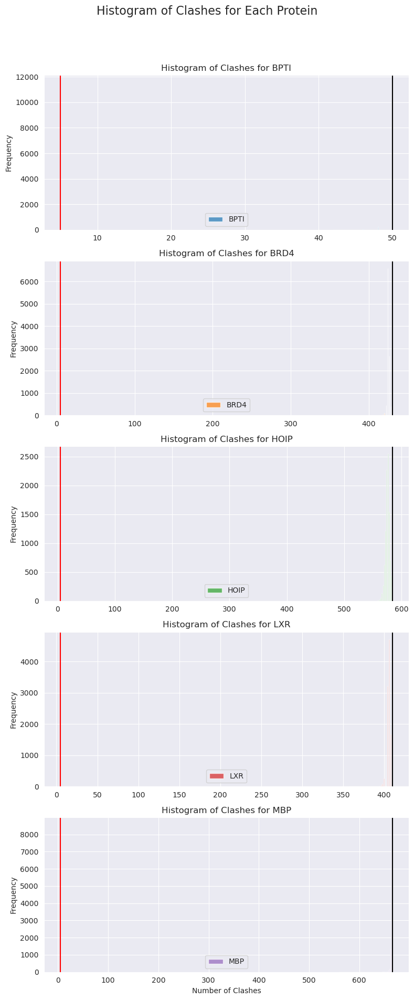

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set a custom style for the plot
sns.set_style("darkgrid")
# sns.set_palette("viridis", len(protein_names))

# Create a figure with subplots for each protein
fig, axes = plt.subplots(nrows=len(protein_names), ncols=1, figsize=(8, 4*len(protein_names)), sharex=False)
clash_thresholds = [(0.5,99),(0.5,99),(0.5,99),(0.5,99),(0.5,99)]
# Iterate over each protein and plot the histogram on a separate subplot
for i, protein in enumerate(protein_names):
    ax = axes[i]
    clashes = clashes_df[clashes_df["protein"] == protein]["clashes"].values[0]
    frame_mask = all_masks_indexes[protein]
    ax.hist(clashes[frame_mask], bins=100, alpha=0.7, label=protein, color=f"C{i}")
    
    ax.set_ylabel("Frequency")
    ax.set_title(f"Histogram of Clashes for {protein}")
    ax.legend()
    # ax.set_yscale("log")
    # ax.set_xscale("log")
    
    max_clash = np.percentile(clashes[frame_mask],100)
    print(max_clash)

    n_residues = len(res_data[protein])

    sqrt_res = np.sqrt(n_residues)

    res_clash_threshold = sqrt_res//2
    res_clash_threshold = 5
    ax.axvline(res_clash_threshold, c="red")


    ax.axvline(max_clash, c="black")

    # calculate the percentage of frames above the threshold
    above_threshold = np.sum(clashes[frame_mask] > max_clash) / len(clashes[frame_mask]) * 100
    print(f"Percentage of frames with clashes above {max_clash} for {protein}: {above_threshold:.2f}%")

    above_threshold = np.sum(clashes[frame_mask] > res_clash_threshold) / len(clashes[frame_mask]) * 100
    print(f"Percentage of frames with clashes above {res_clash_threshold} for {protein}: {above_threshold:.2f}%")

    # Set x-axis label only for the bottom subplot
    if i == len(protein_names) - 1:
        ax.set_xlabel("Number of Clashes")
    
    # Adjust the spacing between subplots
    plt.subplots_adjust(hspace=0.4)

# Add a main title for the entire figure
fig.suptitle("Histogram of Clashes for Each Protein", fontsize=16)

plt.tight_layout(rect=[0, 0.03, 1, 0.95])  # Adjust the spacing at the top to accommodate the main title
plt.show()

(11819, 5)
(10441, 5)
(10101, 5)
(11571, 5)
(11133, 5)


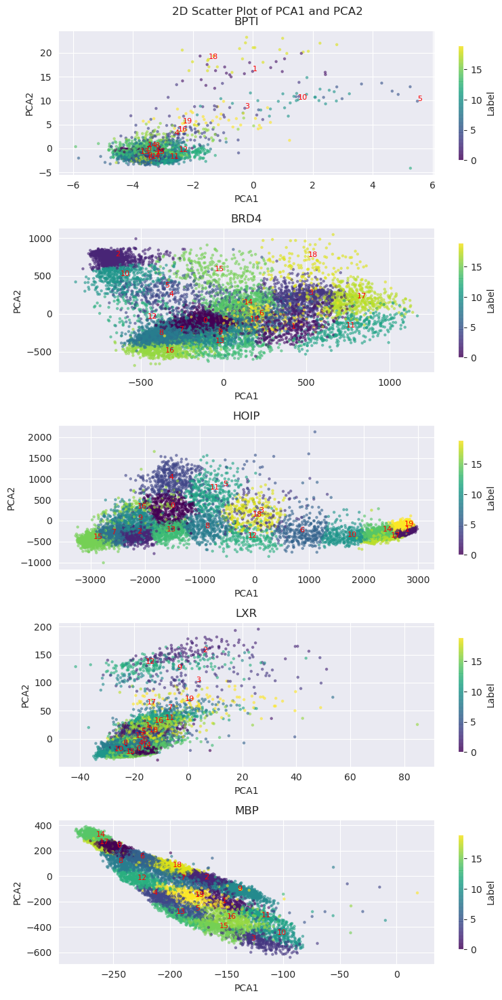

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Create a 2D plot for each protein
fig, axes = plt.subplots(len(protein_names), 1, figsize=(8, 3*len(protein_names)), sharex=False, sharey=False)
fig.tight_layout(pad=3.0)

for i, protein in enumerate(protein_names):
    intra_residue_dists = intra_residue_dist_df[intra_residue_dist_df["protein"]==protein]["intra_residue_dist"].values[0]
    rmsd = RMSD_df[RMSD_df["protein"] == protein]["RMSD"].values[0]
    plddt = plddt_data[protein]
    
    max_pae = max_pae_data[protein]
    ptm = ptm_data[protein]



    
    c = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
    covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
    pca = pca_df[pca_df["protein"]==protein]["pca"].values[0]
    frame_mask = all_masks_indexes[protein]
    labels = all_masks_labels[protein]

    _pca = pca[frame_mask]
    print(_pca.shape)
    pca1 = _pca[:,0]
    pca2 = _pca[:,1]

    scatter = axes[i].scatter(pca1, pca2, c=labels, cmap='viridis', alpha=0.5, s=5)

    closest_frames = all_masks_frames[protein]
    if len(closest_frames) <= 25:
        # annotate each cluster_center with its cluster number
        for j, txt in enumerate(closest_frames):




            axes[i].annotate(j, (_pca[txt, 0], _pca[txt, 1]), fontsize=8, color='red')


            # axes[i].annotate(i, (new_cluster_centers[i, 0], new_cluster_centers[i, 1]), fontsize=8, color='red')
        



    axes[i].set_title(protein)
    axes[i].set_xlabel('PCA1')
    axes[i].set_ylabel('PCA2')

    # Add colorbar
    
    cbar = fig.colorbar(scatter, ax=axes[i], shrink=0.8)
    cbar.set_label('Label')

fig.suptitle('2D Scatter Plot of PCA1 and PCA2')
plt.tight_layout()
plt.show()

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage

# Create subplots for the scatter plot and dendrogram
fig = plt.figure(figsize=(12, 3*len(protein_names)))
gs = fig.add_gridspec(len(protein_names), 2, width_ratios=[2, 1])

for i, protein in enumerate(protein_names):
    break
    intra_residue_dists = intra_residue_dist_df[intra_residue_dist_df["protein"]==protein]["intra_residue_dist"].values[0]
    rmsd = RMSD_df[RMSD_df["protein"] == protein]["RMSD"].values[0]
    plddt = plddt_data[protein]
    max_pae = max_pae_data[protein]
    ptm = ptm_data[protein]
    c = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
    covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
    pca = pca_df[pca_df["protein"]==protein]["pca"].values[0]
    frame_mask = all_masks_indexes[protein]
    
    # Extract the PCA features for the frame_mask indices
    _pca = pca[frame_mask]
    
    # Perform hierarchical clustering
    n_clusters = 10  # Specify the desired number of clusters
    linkage_matrix = linkage(_pca, method='ward')
    hierarchical = AgglomerativeClustering(n_clusters=n_clusters)
    labels = hierarchical.fit_predict(_pca)
    
    # Create scatter plot
    ax_scatter = fig.add_subplot(gs[i, 0])
    pca1 = _pca[:,0]
    pca2 = _pca[:,1]
    scatter = ax_scatter.scatter(pca1, pca2, c=labels, cmap='viridis', alpha=0.5, s=5)
    
    # Annotate each cluster center with its cluster number
    cluster_centers = []
    for j in range(n_clusters):
        cluster_points = _pca[labels == j]
        cluster_center = np.mean(cluster_points, axis=0)
        cluster_centers.append(cluster_center)
        ax_scatter.annotate(j, (cluster_center[0], cluster_center[1]), fontsize=8, color='red')
    
    ax_scatter.set_title(protein)
    ax_scatter.set_xlabel('PCA1')
    ax_scatter.set_ylabel('PCA2')
    
    # Add colorbar
    cbar = fig.colorbar(scatter, ax=ax_scatter, shrink=0.8)
    cbar.set_label('Cluster')
    
    # Create dendrogram
    ax_dendrogram = fig.add_subplot(gs[i, 1])
    dendrogram(linkage_matrix, ax=ax_dendrogram)
    ax_dendrogram.set_title('Dendrogram')
    ax_dendrogram.set_xlabel('Sample Index')
    ax_dendrogram.set_ylabel('Distance')

fig.suptitle('2D Scatter Plot of PCA1 and PCA2 with Hierarchical Clustering and Dendrogram')
plt.tight_layout()
plt.show()

<Figure size 1200x1500 with 0 Axes>

In [ ]:
import numpy as np
from scipy.spatial.distance import pdist, squareform
from scipy.stats import pearsonr
from MDAnalysis.analysis.align import AlignTraj

def calc_intra_residue_cross_correlation(universe, frame_indexes, residues:list=None):
    """
    After aligning the trajectory in memory, calculate the cross correlation
    of the intra-residue distances between the specified frame indexes.
    """
    sel = "protein and name CA"
    if residues is not None:
        resi_sel = " or ".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"

    ref = universe.select_atoms(sel)

    # Align the trajectory to the first frame
    alignment = AlignTraj(universe, ref, select=sel, in_memory=True).run()

    n_frames = len(frame_indexes)
    n_residues = len(ref.residues)

    # Calculate the intra-residue distance matrices for the specified frames
    dist_matrices = []
    for frame_index in frame_indexes:
        universe.trajectory[frame_index]
        coords = ref.positions
        dist_matrix = squareform(pdist(coords))
        dist_matrices.append(dist_matrix)

    # Calculate the cross correlation between the specified frames
    cross_correlation_matrix = np.zeros((n_frames, n_frames))
    for i in range(n_frames):
        for j in range(n_frames):
            cross_correlation_matrix[i, j] = pearsonr(dist_matrices[i].flatten(), dist_matrices[j].flatten())[0]

    return cross_correlation_matrix

# ... (rest of the code remains the same)


In [ ]:

no_maskintra_residue_cross_correlation_df = pd.DataFrame()

for protein in protein_names:
    frame_indexes = no_mask_frames[protein]
      # Specify the frame indexes for cross correlation calculation
    residues = res_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    intra_residue_cross_correlation = calc_intra_residue_cross_correlation(universe, frame_indexes, residues=residues)
    df_to_add = pd.DataFrame({"protein": protein, "intra_residue_cross_correlation": [intra_residue_cross_correlation]})
    no_maskintra_residue_cross_correlation_df = pd.concat([no_maskintra_residue_cross_correlation_df, df_to_add], axis=0)



/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



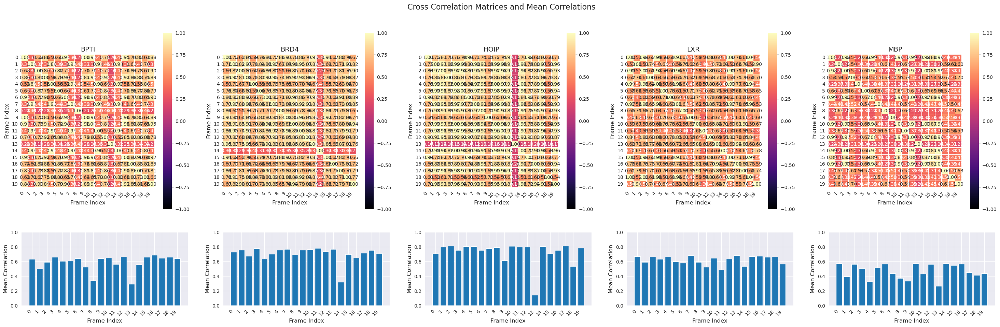

In [ ]:


import seaborn as sns
import matplotlib.pyplot as plt

# Create a single figure with subplots for each protein
n_proteins = len(protein_names)
fig, axes = plt.subplots(2, n_proteins, figsize=(6 * n_proteins, 10), gridspec_kw={'height_ratios': [3, 1]})

for i, protein in enumerate(protein_names):
    cross_correlation_matrix = no_maskintra_residue_cross_correlation_df[no_maskintra_residue_cross_correlation_df["protein"] == protein]["intra_residue_cross_correlation"].values[0]
    row_sum = np.sum(cross_correlation_matrix, axis=1)
    mean_rows = [(row - 1) / len(row_sum) for row in row_sum]

    # Plot the heatmap on the corresponding subplot
    sns.heatmap(cross_correlation_matrix, cmap="magma", vmin=-1, vmax=1, annot=True, fmt=".2f", square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=axes[0, i])

    # Set the title and labels for each heatmap subplot
    axes[0, i].set_title(f"{protein}", fontsize=14)
    axes[0, i].set_xlabel("Frame Index", fontsize=12)
    axes[0, i].set_ylabel("Frame Index", fontsize=12)

    # Rotate the x-tick labels for better readability
    axes[0, i].set_xticklabels(axes[0, i].get_xticklabels(), rotation=45, ha='right', fontsize=10)
    axes[0, i].set_yticklabels(axes[0, i].get_yticklabels(), rotation=0, fontsize=10)

    # Plot the mean row as a bar chart on the corresponding subplot
    axes[1, i].bar(range(len(mean_rows)), mean_rows)
    axes[1, i].set_xlabel("Frame Index", fontsize=12)
    axes[1, i].set_ylabel("Mean Correlation", fontsize=12)
    axes[1, i].set_ylim(0,1)

    axes[1, i].set_xticks(range(len(mean_rows)))
    axes[1, i].set_xticklabels(range(len(mean_rows)), rotation=45, ha='right', fontsize=10)

# Adjust the spacing between subplots
plt.tight_layout(pad=3.0)

# Add a main title for the entire figure
fig.suptitle("Cross Correlation Matrices and Mean Correlations", fontsize=16)

# Display the plot
plt.show()

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



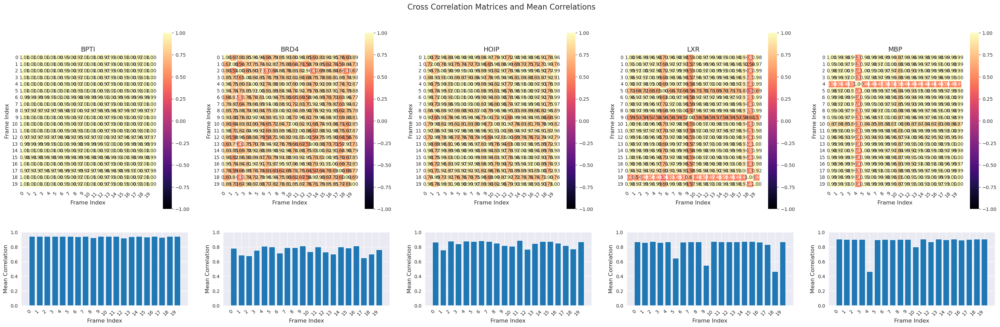

In [ ]:

confmask_intra_residue_cross_correlation_df = pd.DataFrame()

for protein in protein_names:
    frame_indexes = conf_masks_frames[protein]
      # Specify the frame indexes for cross correlation calculation
    residues = res_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    intra_residue_cross_correlation = calc_intra_residue_cross_correlation(universe, frame_indexes, residues=residues)
    df_to_add = pd.DataFrame({"protein": protein, "intra_residue_cross_correlation": [intra_residue_cross_correlation]})
    confmask_intra_residue_cross_correlation_df = pd.concat([confmask_intra_residue_cross_correlation_df, df_to_add], axis=0)

import seaborn as sns
import matplotlib.pyplot as plt

# Create a single figure with subplots for each protein
n_proteins = len(protein_names)
fig, axes = plt.subplots(2, n_proteins, figsize=(6 * n_proteins, 10), gridspec_kw={'height_ratios': [3, 1]})

for i, protein in enumerate(protein_names):
    cross_correlation_matrix = confmask_intra_residue_cross_correlation_df[confmask_intra_residue_cross_correlation_df["protein"] == protein]["intra_residue_cross_correlation"].values[0]
    row_sum = np.sum(cross_correlation_matrix, axis=1)
    mean_rows = [(row - 1) / len(row_sum) for row in row_sum]

    # Plot the heatmap on the corresponding subplot
    sns.heatmap(cross_correlation_matrix, cmap="magma", vmin=-1, vmax=1, annot=True, fmt=".2f", square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=axes[0, i])

    # Set the title and labels for each heatmap subplot
    axes[0, i].set_title(f"{protein}", fontsize=14)
    axes[0, i].set_xlabel("Frame Index", fontsize=12)
    axes[0, i].set_ylabel("Frame Index", fontsize=12)

    # Rotate the x-tick labels for better readability
    axes[0, i].set_xticklabels(axes[0, i].get_xticklabels(), rotation=45, ha='right', fontsize=10)
    axes[0, i].set_yticklabels(axes[0, i].get_yticklabels(), rotation=0, fontsize=10)

    # Plot the mean row as a bar chart on the corresponding subplot
    axes[1, i].bar(range(len(mean_rows)), mean_rows)
    axes[1, i].set_xlabel("Frame Index", fontsize=12)
    axes[1, i].set_ylabel("Mean Correlation", fontsize=12)
    axes[1, i].set_ylim(0,1)

    axes[1, i].set_xticks(range(len(mean_rows)))
    axes[1, i].set_xticklabels(range(len(mean_rows)), rotation=45, ha='right', fontsize=10)

# Adjust the spacing between subplots
plt.tight_layout(pad=3.0)

# Add a main title for the entire figure
fig.suptitle("Cross Correlation Matrices and Mean Correlations", fontsize=16)

# Display the plot
plt.show()

In [ ]:

con_cov_intra_residue_cross_correlation_df = pd.DataFrame()

for protein in protein_names:
    frame_indexes = con_cov_masks_frames[protein]
      # Specify the frame indexes for cross correlation calculation
    residues = res_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    intra_residue_cross_correlation = calc_intra_residue_cross_correlation(universe, frame_indexes, residues=residues)
    df_to_add = pd.DataFrame({"protein": protein, "intra_residue_cross_correlation": [intra_residue_cross_correlation]})
    con_cov_intra_residue_cross_correlation_df = pd.concat([con_cov_intra_residue_cross_correlation_df, df_to_add], axis=0)


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



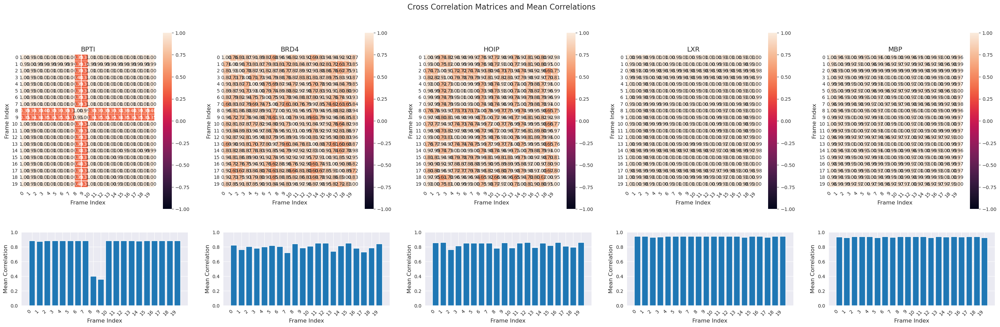

In [ ]:

import seaborn as sns
import matplotlib.pyplot as plt

# Create a single figure with subplots for each protein
n_proteins = len(protein_names)
fig, axes = plt.subplots(2, n_proteins, figsize=(6 * n_proteins, 10), gridspec_kw={'height_ratios': [3, 1]})

for i, protein in enumerate(protein_names):
    cross_correlation_matrix = con_cov_intra_residue_cross_correlation_df[con_cov_intra_residue_cross_correlation_df["protein"] == protein]["intra_residue_cross_correlation"].values[0]
    row_sum = np.sum(cross_correlation_matrix, axis=1)
    mean_rows = [(row - 1) / len(row_sum) for row in row_sum]

    # create purple white green color map
    pwg_cmap = sns.diverging_palette(150, 275, s=80, l=55, n=9, as_cmap=True)
    # Plot the heatmap on the corresponding subplot
    sns.heatmap(cross_correlation_matrix, cmap="rocket", vmin=-1, vmax=1, annot=True, fmt=".2f", square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=axes[0, i])

    # Set the title and labels for each heatmap subplot
    axes[0, i].set_title(f"{protein}", fontsize=14)
    axes[0, i].set_xlabel("Frame Index", fontsize=12)
    axes[0, i].set_ylabel("Frame Index", fontsize=12)

    # Rotate the x-tick labels for better readability
    axes[0, i].set_xticklabels(axes[0, i].get_xticklabels(), rotation=45, ha='right', fontsize=10)
    axes[0, i].set_yticklabels(axes[0, i].get_yticklabels(), rotation=0, fontsize=10)

    # Plot the mean row as a bar chart on the corresponding subplot
    axes[1, i].bar(range(len(mean_rows)), mean_rows)
    axes[1, i].set_xlabel("Frame Index", fontsize=12)
    axes[1, i].set_ylabel("Mean Correlation", fontsize=12)
    axes[1, i].set_ylim(0,1)

    axes[1, i].set_xticks(range(len(mean_rows)))
    axes[1, i].set_xticklabels(range(len(mean_rows)), rotation=45, ha='right', fontsize=10)

# Adjust the spacing between subplots
plt.tight_layout(pad=3.0)

# Add a main title for the entire figure
fig.suptitle("Cross Correlation Matrices and Mean Correlations", fontsize=16)

# Display the plot
plt.show()

In [ ]:

full_mask_intra_residue_cross_correlation_df = pd.DataFrame()

for protein in protein_names:
    frame_indexes = all_masks_frames[protein]
      # Specify the frame indexes for cross correlation calculation
    residues = res_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    intra_residue_cross_correlation = calc_intra_residue_cross_correlation(universe, frame_indexes, residues=residues)
    df_to_add = pd.DataFrame({"protein": protein, "intra_residue_cross_correlation": [intra_residue_cross_correlation]})
    full_mask_intra_residue_cross_correlation_df = pd.concat([full_mask_intra_residue_cross_correlation_df, df_to_add], axis=0)


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



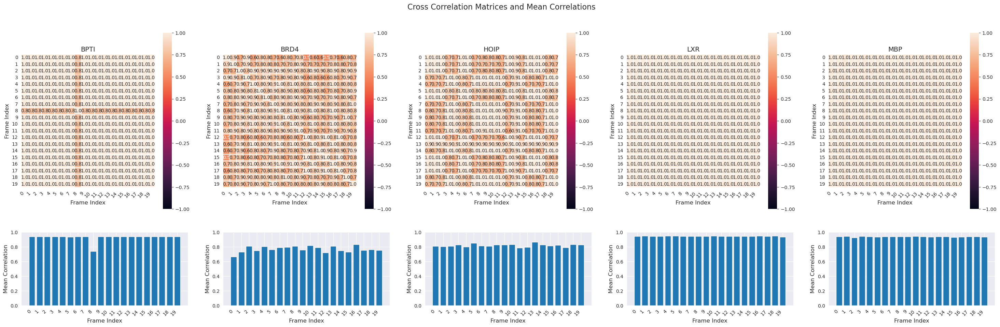

In [ ]:

import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Create a single figure with subplots for each protein
n_proteins = len(protein_names)
fig, axes = plt.subplots(2, n_proteins, figsize=(6 * n_proteins, 10), gridspec_kw={'height_ratios': [3, 1]})

for i, protein in enumerate(protein_names):
    cross_correlation_matrix = full_mask_intra_residue_cross_correlation_df[full_mask_intra_residue_cross_correlation_df["protein"] == protein]["intra_residue_cross_correlation"].values[0]
    row_sum = np.sum(cross_correlation_matrix, axis=1)
    mean_rows = [(row - 1) / len(row_sum) for row in row_sum]

    # create purple white green color map (-1, 0, 1)
    # pwg_cmap = sns.diverging_palette(275, 150, s=150, l=55, n=50, as_cmap=True)
    # Plot the heatmap on the corresponding subplot
    sns.heatmap(cross_correlation_matrix, cmap="rocket", vmin=-1, vmax=1, annot=True, fmt=".1f", square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=axes[0, i])

    # Set the title and labels for each heatmap subplot
    axes[0, i].set_title(f"{protein}", fontsize=14)
    axes[0, i].set_xlabel("Frame Index", fontsize=12)
    axes[0, i].set_ylabel("Frame Index", fontsize=12)

    # Rotate the x-tick labels for better readability
    axes[0, i].set_xticklabels(axes[0, i].get_xticklabels(), rotation=45, ha='right', fontsize=10)
    axes[0, i].set_yticklabels(axes[0, i].get_yticklabels(), rotation=0, fontsize=10)

    # Plot the mean row as a bar chart on the corresponding subplot
    axes[1, i].bar(range(len(mean_rows)), mean_rows)
    axes[1, i].set_xlabel("Frame Index", fontsize=12)
    axes[1, i].set_ylabel("Mean Correlation", fontsize=12)
    axes[1, i].set_xticks(range(len(mean_rows)))
    axes[1, i].set_xticklabels(range(len(mean_rows)), rotation=45, ha='right', fontsize=10)
    axes[1, i].set_ylim(0,1)

# Adjust the spacing between subplots
plt.tight_layout(pad=3.0)

# Add a main title for the entire figure
fig.suptitle("Cross Correlation Matrices and Mean Correlations", fontsize=16)

# Display the plot
plt.show()

BPTI
[ 1893 11804  7418 11602 11535 10901  1464  4156 10985   385 10822  1855
 11406  7758  6797  5823 11731  7009 11004 11597]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



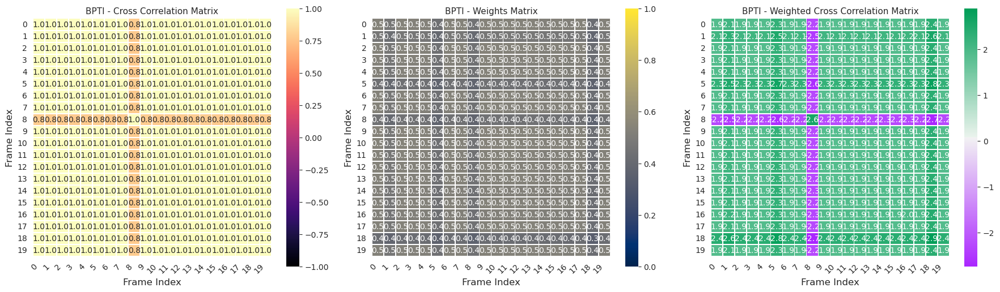

BRD4
[ 7732  9120  4596  6424  7888  3449  7709  6131  7591 10101  2015 10240
  4809  7489  3507  4407  3153  6150  9016   806]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



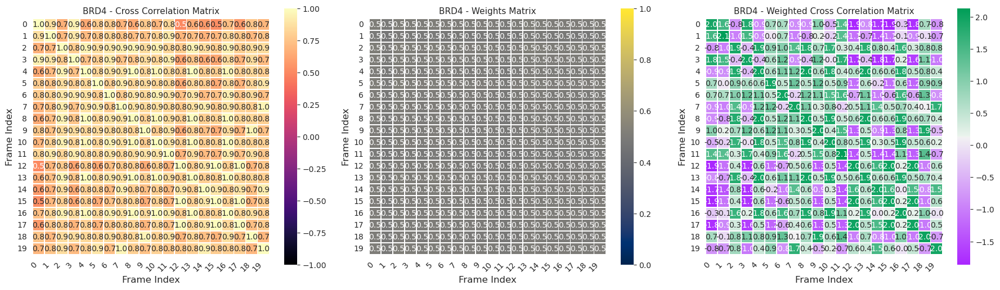

HOIP
[  360   754  4656  9101 10007  9538  7941  6592  9209  8721  8022  7731
  4925  6856  5922  4687  6299  1671  6630  1606]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



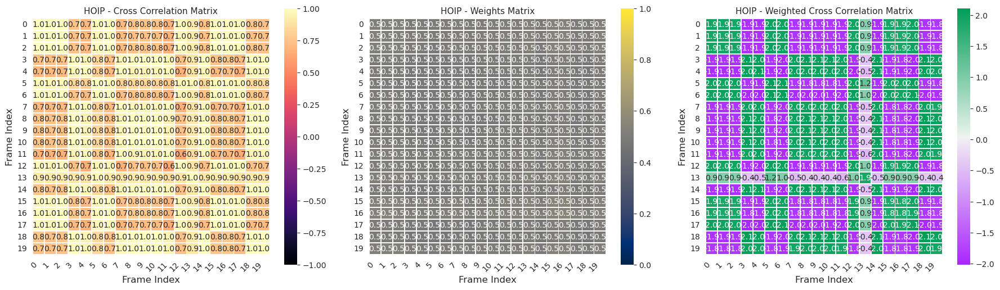

LXR
[ 1253  8306 11022 11246   598  6581   505 11076  8384 11239   435  9784
  9978  1135  9315  1053  6982 10563  3804 11242]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



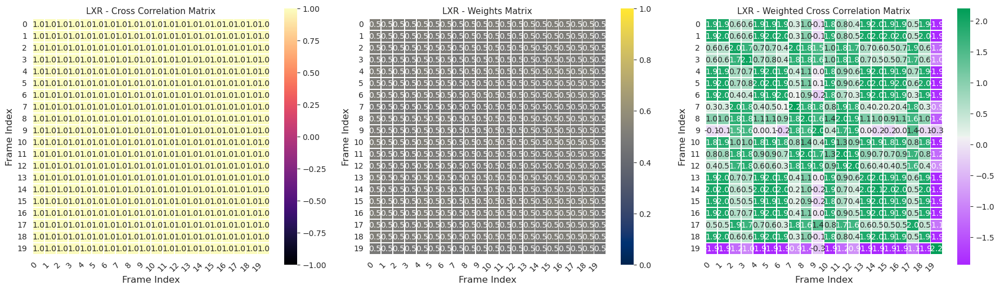

MBP
[4824 2559 3429 9214 1872 9870 4925 2553 2602 4880 5718 4604 5444 5960
 1801 9996 9418 3179 3133 9390]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



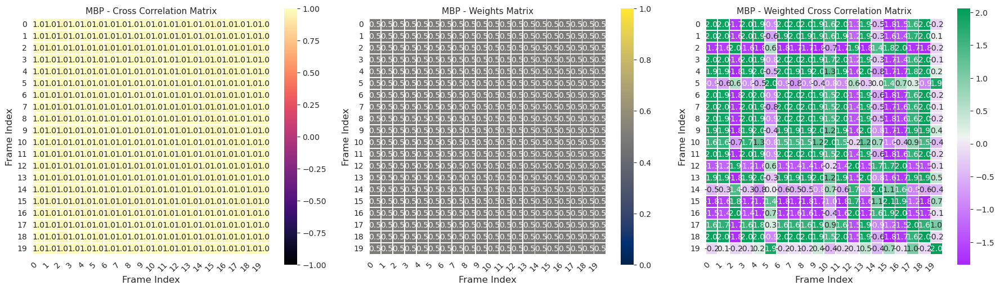

In [ ]:

import datetime


def calc_intra_residue_cross_correlation(universe, frame_indexes, residues):
    sel = "protein and name CA"
    if residues is not None:
        resi_sel = " or ".join([f" resid {res}" for res in residues])
        sel = sel + f" and ({resi_sel})"

    if frame_indexes is None:
        frame_indexes = list(range(len(universe.trajectory)))


    ref = universe.select_atoms(sel)

    alignment = AlignTraj(universe, ref, select=sel, in_memory=True).run()

    n_frames = len(frame_indexes)
    n_residues = len(ref.residues)

    dist_matrices = []
    for frame_index in frame_indexes:
        universe.trajectory[frame_index]
        coords = ref.positions
        dist_matrix = squareform(pdist(coords))
        dist_matrices.append(dist_matrix)

    cross_correlation_matrix = np.zeros((n_frames, n_frames))
    for i in range(n_frames):
        for j in range(n_frames):
            cross_correlation_matrix[i, j] = pearsonr(dist_matrices[i].flatten(), dist_matrices[j].flatten())[0]

    return cross_correlation_matrix

def calc_weights_matrix(weights):

    n_frames = len(weights)

    weights_matrix = np.zeros((n_frames, n_frames))
    for i in range(n_frames):
        for j in range(n_frames):
            weights_ij = np.outer(weights[i], weights[j])[0][0]
            sum_weights = np.sum([weights[i], weights[j]])
            weights_matrix[i, j] = (float(weights_ij)/sum_weights) 

    return weights_matrix

def calc_weighted_intra_residue_cross_correlation(cross_correlation_matrix, weights):
    n_frames = len(weights)
    dist_matrices = []

    weighted_cross_correlation_matrix = np.zeros((n_frames, n_frames))
    for i in range(n_frames):
        for j in range(n_frames):
            weights_ij = np.outer(weights[i], weights[j])[0][0]
            sum_weights = np.sum([weights[i], weights[j]])
            weighted_cross_correlation_matrix[i, j] =  pearsonr(cross_correlation_matrix[i].flatten(), cross_correlation_matrix[j].flatten())[0]/(float(weights_ij)/sum_weights) 

    return weighted_cross_correlation_matrix





def plot_cross_correlation_matrices(universe, weights, residues, title_str, frame_indexes=None, save_dir=None):
    
    if frame_indexes is not None:
        assert len(weights) == len(frame_indexes), f"Number of weights {len(weights)} must match number of frame indexes {len(frame_indexes)}"

    # normalise weights to sum to the number of frames
    weights =  (weights/np.sum(weights))*len(weights)

    cross_correlation_matrix = calc_intra_residue_cross_correlation(universe, frame_indexes, residues)
    weights_matrix = calc_weights_matrix(weights)
    weighted_cross_correlation_matrix = calc_weighted_intra_residue_cross_correlation(cross_correlation_matrix, weights)

    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18, 6))

    sns.heatmap(cross_correlation_matrix, cmap="magma", vmin=-1, vmax=1, annot=True, fmt=".1f", square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=ax1)
    ax1.set_title(f"{title_str} - Cross Correlation Matrix", fontsize=11)
    ax1.set_xlabel("Frame Index", fontsize=12)
    ax1.set_ylabel("Frame Index", fontsize=12)
    ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right', fontsize=10)
    ax1.set_yticklabels(ax1.get_yticklabels(), rotation=0, fontsize=10)

    pwg_cmap = sns.diverging_palette(275, 150, s=150, l=55, n=50, as_cmap=True)

    sns.heatmap(weights_matrix, cmap="cividis", vmin=0, vmax=1, annot=True, fmt=".1f", square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=ax2)
    ax2.set_title(f"{title_str} - Weights Matrix", fontsize=11)
    ax2.set_xlabel("Frame Index", fontsize=12)
    ax2.set_ylabel("Frame Index", fontsize=12)
    ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha='right', fontsize=10)
    ax2.set_yticklabels(ax2.get_yticklabels(), rotation=0, fontsize=10)


    sns.heatmap(weighted_cross_correlation_matrix, cmap=pwg_cmap, annot=True, fmt=".1f", square=True,
                linewidths=0.5, cbar_kws={"shrink": 0.8}, ax=ax3)
    ax3.set_title(f"{title_str} - Weighted Cross Correlation Matrix", fontsize=11)
    ax3.set_xlabel("Frame Index", fontsize=12)
    ax3.set_ylabel("Frame Index", fontsize=12)
    ax3.set_xticklabels(ax3.get_xticklabels(), rotation=45, ha='right', fontsize=10)
    ax3.set_yticklabels(ax3.get_yticklabels(), rotation=0, fontsize=10)

    plt.tight_layout()

    if save_dir is not None:
        time= datetime.datetime.now().strftime("%Y%m%d-%H%M%S.%f")[:-3]
        save_name = f"{title_str}_cross_correlation_matrices{time}.png"
        save_path = os.path.join(save_dir, save_name)        
        plt.savefig(save_path, format='png', dpi=300)
    else:
        plt.show()
        plt.close()


for i, protein in enumerate(protein_names):
    print(protein)
    frame_mask = all_masks_frames[protein]
    print(frame_mask)
    weights = plddt_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    residues = res_data[protein]
    weights = weights[frame_mask]
    plot_cross_correlation_matrices(universe, weights, residues, protein, frame_indexes=frame_mask, save_dir=None)




In [ ]:
# save trajectory frames to a new trajectory file - replace ".xtc" with "_all_filtered.xtc"
masked_phate_df = pd.DataFrame()
for protein in protein_names:
    # break÷
    frame_mask = all_masks_indexes[protein]
    traj = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    print(protein, len(frame_mask))
    # pass
    new_traj_path = proteins[protein]["traj"].replace(".xtc", "_all_filtered.xtc")
    
    with mda.Writer(new_traj_path, traj.atoms.n_atoms) as W:
        for frame in frame_mask:
            traj.trajectory[frame]
            W.write(traj.atoms)

    new_traj = mda.Universe(proteins[protein]["top"], new_traj_path)
    print(len(new_traj.trajectory))
    phate_embedding = calculate_phate(new_traj, num_components=2, residues=residues, ref_frame_index=ref_index)
    df_to_add = pd.DataFrame({"protein": protein, "phate": [phate_embedding], "n_dims": n_dims})
    masked_phate_df = pd.concat([masked_phate_df, df_to_add], axis=0)


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



BPTI 11819


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/coordinates/XDR.py:241: UserWarning:

Reload offsets from trajectory
 ctime or size or n_atoms did not match



11819
11819
Calculating PHATE...
  Running PHATE on 11819 observations and 703 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 0.20 seconds.
    Calculating KNN search...
    Calculated KNN search in 4.97 seconds.
    Calculating affinities...
    Calculated affinities in 0.04 seconds.
  Calculated graph and diffusion operator in 5.21 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.48 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.68 seconds.
  Calculated landmark operator in 2.57 seconds.
  Calculating optimal t...
    Automatically selected t = 61
  Calculated optimal t in 0.85 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.61 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.37 seconds.
Calculated PHATE in 11.61 seconds.
BRD4 10441


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/coordinates/XDR.py:241: UserWarning:

Reload offsets from trajectory
 ctime or size or n_atoms did not match



10441
10441
Calculating PHATE...
  Running PHATE on 10441 observations and 58653 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 16.62 seconds.
    Calculating KNN search...
    Calculated KNN search in 4.18 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 20.84 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.30 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.92 seconds.
  Calculated landmark operator in 2.62 seconds.
  Calculating optimal t...
    Automatically selected t = 48
  Calculated optimal t in 0.76 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.34 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.33 seconds.
Calculated PHATE in 26.91 seconds.
HOIP 10101


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/coordinates/XDR.py:241: UserWarning:

Reload offsets from trajectory
 ctime or size or n_atoms did not match



10101
10101
Calculating PHATE...
  Running PHATE on 10101 observations and 58311 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 16.13 seconds.
    Calculating KNN search...
    Calculated KNN search in 1.39 seconds.
    Calculating affinities...
    Calculated affinities in 0.02 seconds.
  Calculated graph and diffusion operator in 17.54 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.40 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.85 seconds.
  Calculated landmark operator in 2.65 seconds.
  Calculating optimal t...
    Automatically selected t = 39
  Calculated optimal t in 0.74 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.56 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.32 seconds.
Calculated PHATE in 23.81 seconds.
LXR 11571


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/coordinates/XDR.py:241: UserWarning:

Reload offsets from trajectory
 ctime or size or n_atoms did not match



11571
11571
Calculating PHATE...
  Running PHATE on 11571 observations and 23005 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 6.85 seconds.
    Calculating KNN search...
    Calculated KNN search in 3.93 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 10.82 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.30 seconds.
    Calculating KMeans...
    Calculated KMeans in 2.05 seconds.
  Calculated landmark operator in 2.76 seconds.
  Calculating optimal t...
    Automatically selected t = 45
  Calculated optimal t in 0.78 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.42 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.37 seconds.
Calculated PHATE in 17.15 seconds.
MBP 11133


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/coordinates/XDR.py:241: UserWarning:

Reload offsets from trajectory
 ctime or size or n_atoms did not match



11133
11133
Calculating PHATE...
  Running PHATE on 11133 observations and 58653 variables.
  Calculating graph and diffusion operator...
    Calculating PCA...
    Calculated PCA in 17.95 seconds.
    Calculating KNN search...
    Calculated KNN search in 1.42 seconds.
    Calculating affinities...
    Calculated affinities in 0.03 seconds.
  Calculated graph and diffusion operator in 19.40 seconds.
  Calculating landmark operator...
    Calculating SVD...
    Calculated SVD in 0.28 seconds.
    Calculating KMeans...
    Calculated KMeans in 1.52 seconds.
  Calculated landmark operator in 2.21 seconds.
  Calculating optimal t...
    Automatically selected t = 30
  Calculated optimal t in 0.77 seconds.
  Calculating diffusion potential...
  Calculated diffusion potential in 0.36 seconds.
  Calculating metric MDS...
  Calculated metric MDS in 2.35 seconds.
Calculated PHATE in 25.09 seconds.


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Max plddt index 2050
Max pae index 8637


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Max plddt index 2099
Max pae index 467


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Max plddt index 169
Max pae index 10520


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Max plddt index 1676
Max pae index 12015


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



Max plddt index 2391
Max pae index 11414


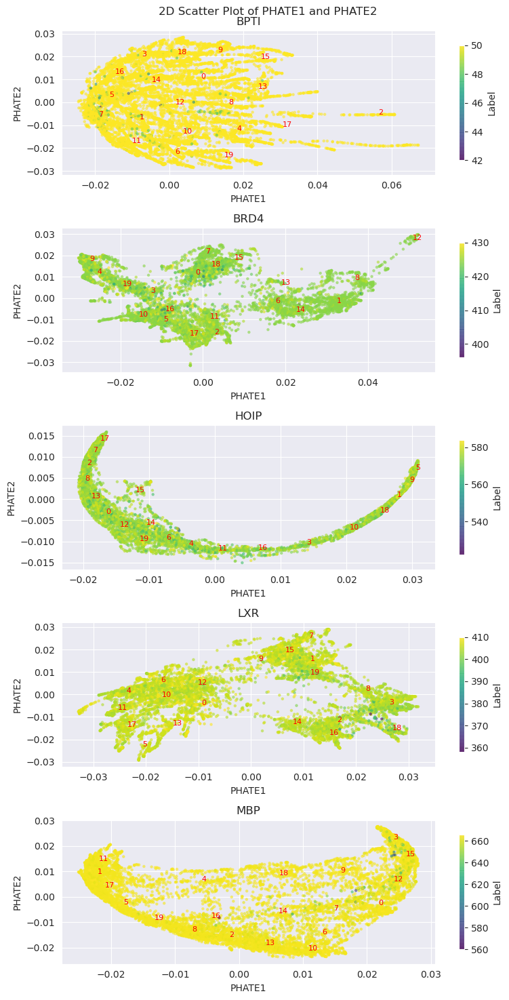

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Create a 2D plot for each protein
fig, axes = plt.subplots(len(protein_names), 1, figsize=(8, 3*len(protein_names)), sharex=False, sharey=False)
fig.tight_layout(pad=3.0)


phate_frames = {}

for i, protein in enumerate(protein_names):
    intra_residue_dists = intra_residue_dist_df[intra_residue_dist_df["protein"]==protein]["intra_residue_dist"].values[0]
    rmsd = RMSD_df[RMSD_df["protein"] == protein]["RMSD"].values[0]
    plddt = plddt_data[protein]
    phate_data = masked_phate_df[masked_phate_df["protein"]==protein]["phate"].values[0]
    max_pae = max_pae_data[protein]
    ptm = ptm_data[protein]


    clashes = clashes_df[clashes_df["protein"] == protein]["clashes"].values[0]
    
    c = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
    covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
    pca = pca_df[pca_df["protein"]==protein]["pca"].values[0]
    frame_mask = all_masks_indexes[protein]
    pca_labels = all_masks_labels[protein]
    pca = phate_data
    _pca = pca
    pca1 = _pca[:,0]
    pca2 = _pca[:,1]
    closest_frames = all_masks_frames[protein]

    kmeans = KMeans(n_clusters=k_clusters, random_state=42)

    kmeans.fit(pca)

    # Get the cluster centers
    cluster_centers = kmeans.cluster_centers_

    # Find the closest frames to each cluster center
    closest_frames = kmeans.transform(phate_data).argmin(axis=0)


    # get cluster labels
    labels = kmeans.labels_

    phate_frames[protein] = closest_frames

    clashes = clashes[frame_mask]

    scatter = axes[i].scatter(pca1, pca2, c=clashes, cmap='viridis', alpha=0.5, s=5)




    if len(closest_frames) <= 25:
        # annotate each cluster_center with its cluster number
        for j, txt in enumerate(closest_frames):


            axes[i].annotate(j, (_pca[txt, 0], _pca[txt, 1]), fontsize=8, color='red')


            # axes[i].annotate(i, (new_cluster_centers[i, 0], new_cluster_centers[i, 1]), fontsize=8, color='red')
        

    max_plddt_index = np.where(plddt == np.max(plddt[frame_mask]))[0][0]
    print("Max plddt index", max_plddt_index)

# 

    max_pae_index = np.where(max_pae == np.max(max_pae[frame_mask]))[0][0]
    print("Max pae index", max_pae_index)   





    axes[i].set_title(protein)
    axes[i].set_xlabel('PHATE1')
    axes[i].set_ylabel('PHATE2')

    # Add colorbar
    
    cbar = fig.colorbar(scatter, ax=axes[i], shrink=0.8)
    cbar.set_label('Label')

fig.suptitle('2D Scatter Plot of PHATE1 and PHATE2')
plt.tight_layout()
plt.show()

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/home/alexi/anaconda3/en

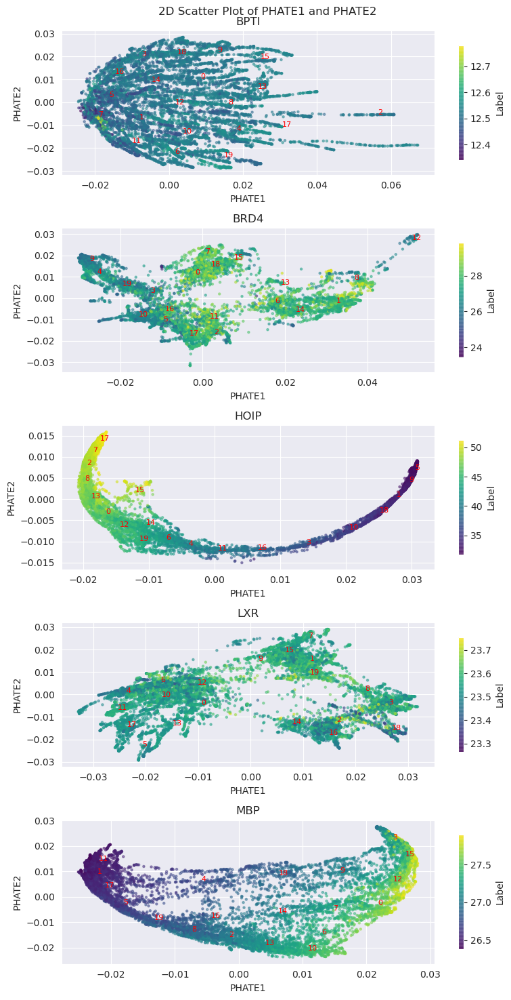

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Create a 2D plot for each protein
fig, axes = plt.subplots(len(protein_names), 1, figsize=(8, 3*len(protein_names)), sharex=False, sharey=False)
fig.tight_layout(pad=3.0)


phate_frames = {}

for i, protein in enumerate(protein_names):
    intra_residue_dists = intra_residue_dist_df[intra_residue_dist_df["protein"]==protein]["intra_residue_dist"].values[0]
    rmsd = RMSD_df[RMSD_df["protein"] == protein]["RMSD"].values[0]
    plddt = plddt_data[protein]
    phate_data = masked_phate_df[masked_phate_df["protein"]==protein]["phate"].values[0]
    max_pae = max_pae_data[protein]
    ptm = ptm_data[protein]



    
    c = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
    covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
    pca = pca_df[pca_df["protein"]==protein]["pca"].values[0]
    frame_mask = all_masks_indexes[protein]
    pca_labels = all_masks_labels[protein]
    pca = phate_data
    _pca = pca
    pca1 = _pca[:,0]
    pca2 = _pca[:,1]
    closest_frames = all_masks_frames[protein]

    kmeans = KMeans(n_clusters=k_clusters, random_state=42)

    kmeans.fit(pca)

    # Get the cluster centers
    cluster_centers = kmeans.cluster_centers_

    # Find the closest frames to each cluster center
    closest_frames = kmeans.transform(phate_data).argmin(axis=0)


    # get cluster labels
    labels = kmeans.labels_

    phate_frames[protein] = closest_frames


    scatter = axes[i].scatter(pca1, pca2, c=intra_residue_dists[frame_mask], cmap='viridis', alpha=0.5, s=5)

    if len(closest_frames) <= 25:
        # annotate each cluster_center with its cluster number
        for j, txt in enumerate(closest_frames):


            axes[i].annotate(j, (_pca[txt, 0], _pca[txt, 1]), fontsize=8, color='red')


            # axes[i].annotate(i, (new_cluster_centers[i, 0], new_cluster_centers[i, 1]), fontsize=8, color='red')
        



    axes[i].set_title(protein)
    axes[i].set_xlabel('PHATE1')
    axes[i].set_ylabel('PHATE2')

    # Add colorbar
    
    cbar = fig.colorbar(scatter, ax=axes[i], shrink=0.8)
    cbar.set_label('Label')

fig.suptitle('2D Scatter Plot of PHATE1 and PHATE2')
plt.tight_layout()
plt.show()

In [ ]:
# import matplotlib.pyplot as plt
# import numpy as np

# # Create a 2D plot for each protein
# fig, axes = plt.subplots(len(protein_names), 1, figsize=(8, 3*len(protein_names)), sharex=False, sharey=False)
# fig.tight_layout(pad=3.0)


# phate_frames = {}

# for i, protein in enumerate(protein_names):
#     intra_residue_dists = intra_residue_dist_df[intra_residue_dist_df["protein"]==protein]["intra_residue_dist"].values[0]
#     rmsd = RMSD_df[RMSD_df["protein"] == protein]["RMSD"].values[0]
#     plddt = plddt_data[protein]
#     phate_data = masked_phate_df[masked_phate_df["protein"]==protein]["phate"].values[0]
#     max_pae = max_pae_data[protein]
#     ptm = ptm_data[protein]



    
#     c = contact_order_df[contact_order_df["protein"] == protein]["contact_order"].values[0]
#     covariance = intra_residue_covariance_df[intra_residue_covariance_df["protein"] == protein]["intra_residue_covariance"].values[0]
#     pca = pca_df[pca_df["protein"]==protein]["pca"].values[0]
#     frame_mask = all_masks_indexes[protein]
#     pca_labels = all_masks_labels[protein]
#     pca = phate_data
#     _pca = pca
#     pca1 = _pca[:,0]
#     pca2 = _pca[:,1]
#     closest_frames = all_masks_frames[protein]

#     kmeans = KMeans(n_clusters=k_clusters, random_state=42)

#     kmeans.fit(pca)

#     # Get the cluster centers
#     cluster_centers = kmeans.cluster_centers_

#     # Find the closest frames to each cluster center
#     closest_frames = kmeans.transform(phate_data).argmin(axis=0)


#     # get cluster labels
#     labels = kmeans.labels_

#     phate_frames[protein] = closest_frames

#     pca = pca_df[pca_df["protein"]==protein]["pca"].values[0]

#     _pca = pca[frame_mask]
#     pca1 = _pca[:,0]
#     pca2 = _pca[:,1]

#     scatter = axes[i].scatter(pca1, pca2, c=labels, cmap='viridis', alpha=0.5, s=5)

#     if len(closest_frames) <= 25:
#         # annotate each cluster_center with its cluster number
#         for j, txt in enumerate(closest_frames):


#             axes[i].annotate(j, (_pca[txt, 0], _pca[txt, 1]), fontsize=8, color='red')


#             # axes[i].annotate(i, (new_cluster_centers[i, 0], new_cluster_centers[i, 1]), fontsize=8, color='red')
        



#     axes[i].set_title(protein)
#     axes[i].set_xlabel('PHATE1')
#     axes[i].set_ylabel('PHATE2')

#     # Add colorbar
    
#     cbar = fig.colorbar(scatter, ax=axes[i], shrink=0.8)
#     cbar.set_label('Label')

# fig.suptitle('2D Scatter Plot of PHATE1 and PHATE2')
# plt.tight_layout()
# plt.show()

BPTI
[ 7314  5571  4148  8618  4726  9039  7541 10814  1023  9815  4508  2761
   270  8115  8924  5637  1749  1327  7216  8147]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



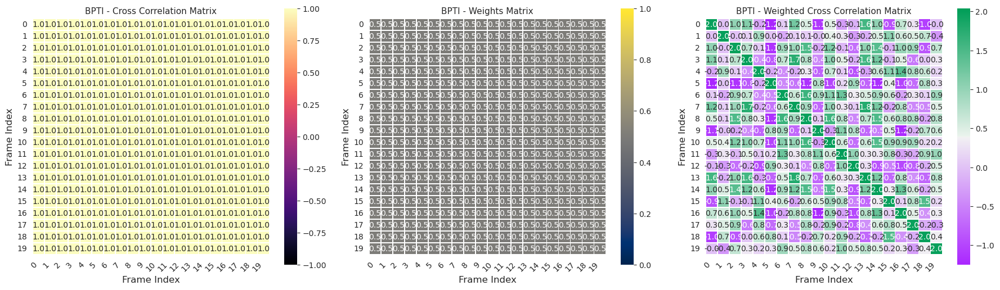

BRD4
[ 8381  1854  4950 10262  5249  2732 10269  4044  8355  4310  3296  8787
  2742  8287  6984   493  9605  6993  2044  9702]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



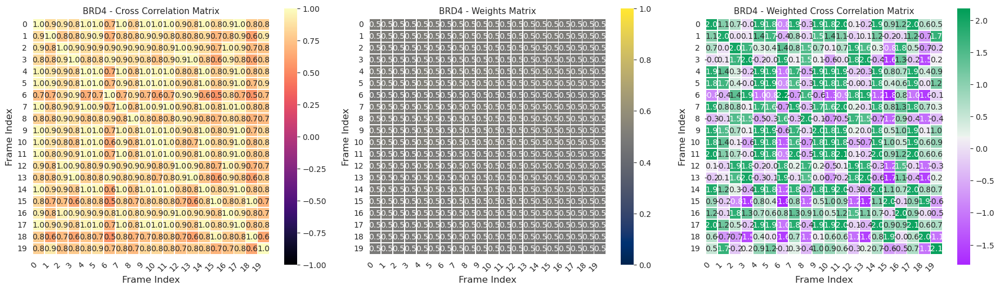

HOIP
[2535  535 8926 4511 9972 2329 6555 3390 7510 3523 3923 5817  360 5490
 7040 9996 9216 8405 5823 7061]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



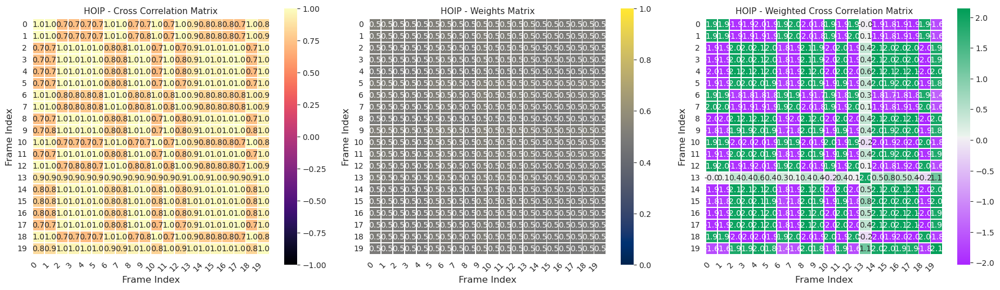

LXR
[ 3772  4248  5535  8720  1543  3526  6429  1446   983  8572  9414  2955
  8376  3260  3861  5755  6462  2889 11197  3587]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



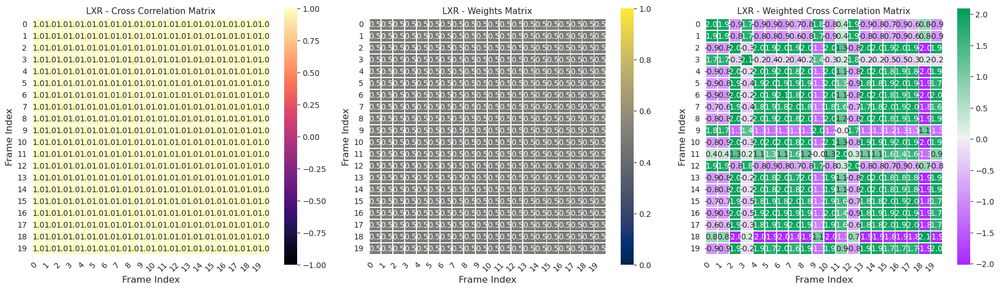

MBP
[  250  4162 10356  7077  2320  7881  8797  7853  5704  1181  6760  8080
 11039  8262  9604 11027  3045  7014  6919  9621]


/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:300: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:301: RuntimeWarning:

invalid value encountered in scalar divide

/home/alexi/anaconda3/envs/HDXER_ENV/lib/python3.8/site-packages/MDAnalysis/lib/mdamath.py:302: RuntimeWarning:

invalid value encountered in scalar divide



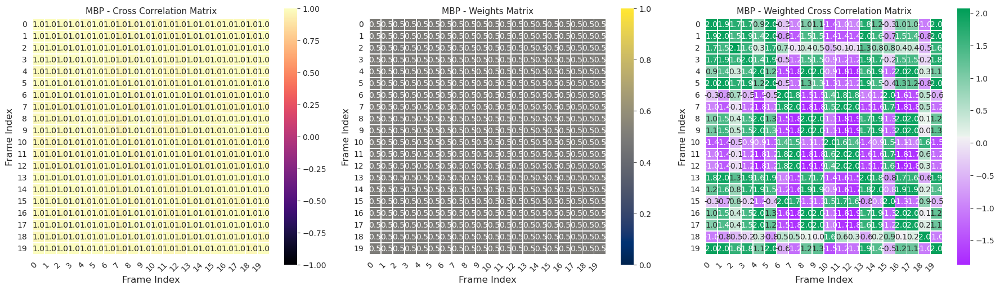

In [ ]:


for i, protein in enumerate(protein_names):
    print(protein)
    frame_mask = phate_frames[protein]
    print(frame_mask)
    weights = plddt_data[protein]
    universe = mda.Universe(proteins[protein]["top"], proteins[protein]["traj"])
    residues = res_data[protein]
    weights = weights[frame_mask]
    plot_cross_correlation_matrices(universe, weights, residues, protein, frame_indexes=frame_mask, save_dir=None)

